# Анализ рынка заведений общепита Москвы

**Цель проектной работы** – выполнить исследование рынка общественного питания Москвы и выработать рекомендаций по открытию кофейни.

**Заказчики проектной работы** – инвесторы фонда «Shut Up and Take My Money».

**Конечный результат проектной работы** – на основе проведенного анализа сформировать рекомендации для открытии кофейни и подготовить [презентацию](https://drive.google.com/file/d/1pS_4tx2xG5mUVr1UIT-YP4n_Gv7C4L0E/view?usp=sharing) исследования для инвесторов.

Основным источником данных является информация сервисов Яндекс.Карты и Яндекс.Бизнес (по состоянию на лето 2022 г.). Датасет `moscow_places` состоит из следующих колонок:

* `name` – название заведения;
* `address` – адрес заведения;
* `category` – категория заведения, например «кафе», «пиццерия» или «кофейня»;
* `hours` – информация о днях и часах работы;
* `lat` – широта географической точки, в которой находится заведение;
* `lng` – долгота географической точки, в которой находится заведение;
* `rating` – рейтинг заведения по оценкам пользователей в Яндекс Картах;
* `price` – категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
* `avg_bill` – строка, которая хранит среднюю стоимость заказа в виде диапазона;
* `middle_avg_bill` – число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
* `middle_coffee_cup` – число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»
* `chain` – число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки);
* `district` – административный район, в котором находится заведение, например Центральный административный округ;
* `seats` – количество посадочных мест.

В рамках исследования будут проведены следующие работы:
- предобработка данных и их изучение,
- исследовательский анализ данных, 
- детализация исследования для открытия кофейни.

Импортируем библиотеки, которые потребуются для проведения исследования.

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
import numpy as np
import json # подключение модуля для работы с JSON-форматом
from folium import Map, Choropleth # импортируем карту и фоновую картограмму (хороплет)
from folium import Map, Marker # импортируем карту и маркер
from folium.plugins import MarkerCluster # импортируем кластер

<a id="title"></a>
<h1>Содержание<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Изучение-общей-информации-и-предобработка-данных" data-toc-modified-id="Изучение-общей-информации-и-предобработка-данных-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Изучение общей информации и предобработка данных</a></span><ul class="toc-item"><li><span><a href="#Типы-данных" data-toc-modified-id="Типы-данных-1.1"><span class="toc-item-num">1.1&nbsp;&nbsp;</span>Типы данных</a></span></li><li><span><a href="#Дубликаты-и-пропуски" data-toc-modified-id="Дубликаты-и-пропуски-1.2"><span class="toc-item-num">1.2&nbsp;&nbsp;</span>Дубликаты и пропуски</a></span></li><li><span><a href="#Пропуски-в-столбце-hours" data-toc-modified-id="Пропуски-в-столбце-hours-1.3"><span class="toc-item-num">1.3&nbsp;&nbsp;</span>Пропуски в столбце <code>hours</code></a></span></li><li><span><a href="#Пропуски-в-столбце-price" data-toc-modified-id="Пропуски-в-столбце-price-1.4"><span class="toc-item-num">1.4&nbsp;&nbsp;</span>Пропуски в столбце <code>price</code></a></span></li><li><span><a href="#Пропуски-в-столбцах-avg_bill,-middle_avg_bill-и-middle_coffee_cup" data-toc-modified-id="Пропуски-в-столбцах-avg_bill,-middle_avg_bill-и-middle_coffee_cup-1.5"><span class="toc-item-num">1.5&nbsp;&nbsp;</span>Пропуски в столбцах <code>avg_bill</code>, <code>middle_avg_bill</code> и <code>middle_coffee_cup</code></a></span></li><li><span><a href="#Пропуски-в-столбце-seats" data-toc-modified-id="Пропуски-в-столбце-seats-1.6"><span class="toc-item-num">1.6&nbsp;&nbsp;</span>Пропуски в столбце <code>seats</code></a></span></li><li><span><a href="#Создание-столбца-street" data-toc-modified-id="Создание-столбца-street-1.7"><span class="toc-item-num">1.7&nbsp;&nbsp;</span>Создание столбца <code>street</code></a></span></li><li><span><a href="#Создание-столбца-is_24/7" data-toc-modified-id="Создание-столбца-is_24/7-1.8"><span class="toc-item-num">1.8&nbsp;&nbsp;</span>Создание столбца <code>is_24/7</code></a></span></li><li><span><a href="#Краткие-выводы-по-итогам-предобработки-данных" data-toc-modified-id="Краткие-выводы-по-итогам-предобработки-данных-1.9"><span class="toc-item-num">1.9&nbsp;&nbsp;</span>Краткие выводы по итогам предобработки данных</a></span></li></ul></li><li><span><a href="#Анализ-данных" data-toc-modified-id="Анализ-данных-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Анализ данных</a></span><ul class="toc-item"><li><span><a href="#Категории-заведений" data-toc-modified-id="Категории-заведений-2.1"><span class="toc-item-num">2.1&nbsp;&nbsp;</span>Категории заведений</a></span></li><li><span><a href="#Количество-посадочных-мест-по-категориям-заведений" data-toc-modified-id="Количество-посадочных-мест-по-категориям-заведений-2.2"><span class="toc-item-num">2.2&nbsp;&nbsp;</span>Количество посадочных мест по категориям заведений</a></span></li><li><span><a href="#Распределение-сетевых-и-несетевых-заведений" data-toc-modified-id="Распределение-сетевых-и-несетевых-заведений-2.3"><span class="toc-item-num">2.3&nbsp;&nbsp;</span>Распределение сетевых и несетевых заведений</a></span></li><li><span><a href="#Топ-15-популярных-сетей-Москвы" data-toc-modified-id="Топ-15-популярных-сетей-Москвы-2.4"><span class="toc-item-num">2.4&nbsp;&nbsp;</span>Топ-15 популярных сетей Москвы</a></span></li><li><span><a href="#Административные-районы-Москвы" data-toc-modified-id="Административные-районы-Москвы-2.5"><span class="toc-item-num">2.5&nbsp;&nbsp;</span>Административные районы Москвы</a></span></li><li><span><a href="#Средние-рейтинги-по-категориям-заведений" data-toc-modified-id="Средние-рейтинги-по-категориям-заведений-2.6"><span class="toc-item-num">2.6&nbsp;&nbsp;</span>Средние рейтинги по категориям заведений</a></span></li><li><span><a href="#Фоновая-картограмма-(хороплет)-со-средним-рейтингом-заведений" data-toc-modified-id="Фоновая-картограмма-(хороплет)-со-средним-рейтингом-заведений-2.7"><span class="toc-item-num">2.7&nbsp;&nbsp;</span>Фоновая картограмма (хороплет) со средним рейтингом заведений</a></span></li><li><span><a href="#Визуализация-заведений-на-карте-(с-помощью-кластеров-средствами-библиотеки-folium)" data-toc-modified-id="Визуализация-заведений-на-карте-(с-помощью-кластеров-средствами-библиотеки-folium)-2.8"><span class="toc-item-num">2.8&nbsp;&nbsp;</span>Визуализация заведений на карте (с помощью кластеров средствами библиотеки <code>folium</code>)</a></span></li><li><span><a href="#Топ-15-улиц-по-количеству-заведений" data-toc-modified-id="Топ-15-улиц-по-количеству-заведений-2.9"><span class="toc-item-num">2.9&nbsp;&nbsp;</span>Топ-15 улиц по количеству заведений</a></span></li><li><span><a href="#Улицы-с-одним-объектом-общепита" data-toc-modified-id="Улицы-с-одним-объектом-общепита-2.10"><span class="toc-item-num">2.10&nbsp;&nbsp;</span>Улицы с одним объектом общепита</a></span></li><li><span><a href="#Медиана-среднего-чека" data-toc-modified-id="Медиана-среднего-чека-2.11"><span class="toc-item-num">2.11&nbsp;&nbsp;</span>Медиана среднего чека</a></span></li><li><span><a href="#Сравнение-успешных-и-неуспешных-заведений" data-toc-modified-id="Сравнение-успешных-и-неуспешных-заведений-2.12"><span class="toc-item-num">2.12&nbsp;&nbsp;</span>Сравнение успешных и неуспешных заведений</a></span></li><li><span><a href="#Краткие-выводы-по-итогам-исследования-данных" data-toc-modified-id="Краткие-выводы-по-итогам-исследования-данных-2.13"><span class="toc-item-num">2.13&nbsp;&nbsp;</span>Краткие выводы по итогам исследования данных</a></span></li></ul></li><li><span><a href="#Детализация-исследования:-открытие-кофейни" data-toc-modified-id="Детализация-исследования:-открытие-кофейни-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Детализация исследования: открытие кофейни</a></span></li><li><span><a href="#Общие-выводы-и-рекомендации-по-открытию-кофейни" data-toc-modified-id="Общие-выводы-и-рекомендации-по-открытию-кофейни-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Общие выводы и рекомендации по открытию кофейни</a></span></li></ul></div>

## Изучение общей информации и предобработка данных

Сохраним информацию из файла `moscow_places.csv` в переменной `places` и посмотрим на первые пять строк датасета.

In [2]:
places = pd.read_csv('moscow_places.csv')
places.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


Посмотрим на общую информацию о датасете.

In [3]:
places.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


### Типы данных

Практически все типы данных, установленные в столбцах датасета, соответствуют своим значениям, за исключением значений в столбце `seats`: число посадочных мест – всегда целое число, но поскольку этот столбец содержит пропуски, то сменить тип данных с `float` на `integer` не удастся.

### Дубликаты и пропуски

Изучим пропуски в датасете – посчитаем, сколько их в каждом столбце.

In [4]:
# считаем процент пропусков в столбцах датасета
percentage_of_kips = round(places.isna().sum() / places.count().max() * 100, 2)

# выведем названия только тех столбцов, которые содержат пропуски
percentage_of_kips.loc[lambda x: x > 0].sort_values(ascending=False)

middle_coffee_cup    93.64
middle_avg_bill      62.54
price                60.56
avg_bill             54.60
seats                42.96
hours                 6.38
dtype: float64

Большая часть пропусков приходится на взаимосвязанные столбцы `avg_bill`, `middle_avg_bill` и `middle_coffee_cup`, которые хранят информацию о средней стоимости заказа, оценке среднего чека и оценке одной чашки капучинно соответственно. Нам неизвестно, кем именно и каким образом данная информация вносилась в сервис `Яндекс.Бизнес`.

Приступим к «очистке» датасета: попробуем выявить дубликаты и – по мере возможностей – заполнить пропуски в нем. 

Явные дубликаты в датасете отсутствуют.

In [5]:
places.duplicated().sum()

0

Приведем значения в колонке `name` к нижнему регистру и попробуем найти неявные дубликаты по стобцам `name` и `address` одновременно. Но перед этим посчитаем количество уникальных названий заведений в датасете.

In [6]:
# количество уникальных названий точек общепита
places['name'].nunique() 

5614

In [7]:
# приведем значения в столбце к нижнему регистру
places['name'] = places['name'].str.lower()

# посчитаем количество уникальных названий точек общепита
places['name'].nunique() 

5512

В результате приведения значений в столбце `name` к нижнему регистру – количество уникальных названий сократилось `1.8%`. Можно предположить, что, например, названия части заведений, относящихся к сетевым, могли быть названы с ошибкой в регистре. 

Проверим наличие дубликатов по столбцам `name` и `address` и при наличии удалим их с обновлением индексации.

In [8]:
print('количество дубликатов по столбцам "name" и "address" – ', places.duplicated(subset=['name', 'address']).sum())
places[places.duplicated(subset=['name', 'address'])]

количество дубликатов по столбцам "name" и "address" –  3


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1511,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0
2420,раковарня клешни и хвосты,"бар,паб","Москва, проспект Мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0
3109,хлеб да выпечка,кафе,"Москва, Ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276.0


In [9]:
# удаление строк в датасете со схожими значеними в обозначенных столбцах
places = places.drop_duplicates(subset=['name', 'address']).reset_index(drop=True)

# проверим корректность удаления дубликатов
display(places.duplicated(subset=['name', 'address']).sum())

# проверим количество строк в датасете
len(places)

0

8403

Попробуем скорректировать (по возможности) некоторые значения в столбце `name` – применительно к популярным сетевым заведениям Москвы. Но перед этим посчитаем количество каждого из заведений и выведем те из них, которые встречаются чаще всего.

In [10]:
places['name'].value_counts(ascending=False).head(30)

кафе                                   189
шоколадница                            120
домино'с пицца                          77
додо пицца                              74
one price coffee                        72
яндекс лавка                            69
cofix                                   65
prime                                   50
хинкальная                              44
шаурма                                  43
кофепорт                                42
кулинарная лавка братьев караваевых     39
теремок                                 38
чайхана                                 37
ресторан                                34
буханка                                 32
cofefest                                32
столовая                                28
му-му                                   27
drive café                              24
кофемания                               23
андерсон                                22
крошка картошка                         22
cinnabon   

По ключевым словам в названиях популярных заведений попробуем найти схожие в датасете, и если под названием последнего подразумевается название распространенной сети, то скорректируем его, а также приведем в соответствие категоризацию в столбце `chain` (при необходимости).

Начнем с «Шоколадницы» – выделим из нее ключевое слово «шоколад» и поищем похожие названия в датасете.

In [11]:
places[places['name'].str.contains('шокол')]['name'].value_counts()

шоколадница                         120
шоколадка                             1
торты от сети кофеен шоколадница      1
улитка в шоколаде                     1
шоколад                               1
шоколад имбирь корица                 1
Name: name, dtype: int64

In [12]:
# посмотрим на значения в столбце, содержащее название сети
places[places['name'] == 'торты от сети кофеен шоколадница']

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
884,торты от сети кофеен шоколадница,ресторан,"Москва, улица Прянишникова, 23А",Северный административный округ,"ежедневно, 09:00–22:30",55.836231,37.550774,3.9,NaN,NaN,NaN,NaN,0,NaN


Скорректируем название заведения «торты от сети кофеен шоколадница» на «шоколадница», а также установим его принадлежность к сети в колонке `chain`.

In [13]:
# корректируем наименование сети "Шоколадница"
places['name'] = places['name'].replace('торты от сети кофеен шоколадница', 'шоколадница')

# корректируем категоризацию в столбце "chain"
places.loc[(places['name'] == 'шоколадница') & (places['chain'] == 0), 'chain'] = 1

# проверим корректность смены значений в столбцах скорректированной строки (индекс – 884)
places.loc[884] 

name                                     шоколадница
category                                    ресторан
address              Москва, улица Прянишникова, 23А
district             Северный административный округ
hours                         ежедневно, 09:00–22:30
lat                                        55.836231
lng                                        37.550774
rating                                           3.9
price                                            NaN
avg_bill                                         NaN
middle_avg_bill                                  NaN
middle_coffee_cup                                NaN
chain                                              1
seats                                            NaN
Name: 884, dtype: object

Посмотрим, есть ли совпадение по ключевому слову «домин» для сети заведений в `Домино'с пицца`.

In [14]:
places[places['name'].str.contains('домин')]['name'].value_counts()

домино'с пицца    77
доминос пицца      1
домино'с           1
Name: name, dtype: int64

In [15]:
# посмотрим на значения в столбцах со схожим названием
places[(places['name'] == 'доминос пицца') | (places['name'] == "домино'с")] 

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
263,доминос пицца,пиццерия,"Москва, улица Малыгина, 20",Северо-Восточный административный округ,"ежедневно, 11:00–22:00",55.884036,37.689770,4.2,NaN,Средний счёт:от 500 ₽,500.0,NaN,0,28.0
6758,домино'с,пиццерия,"Москва, улица Островитянова, 18",Юго-Западный административный округ,"ежедневно, 10:00–23:00",55.636097,37.511586,4.2,средние,Средний счёт:от 500 ₽,500.0,NaN,0,17.0


In [16]:
# скорректируем названия заведений и их принадлежность к сети
places['name'] = places['name'].replace(['доминос пицца', "домино'с"], "домино'с пицца")
places.loc[(places['name'] == "домино'с пицца") & (places['chain'] == 0), 'chain'] = 1

# проверим корректность смены значений в столбцах скорректированных строках по их индексам (263, 6758)
places.loc[[263, 6758]] 

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
263,домино'с пицца,пиццерия,"Москва, улица Малыгина, 20",Северо-Восточный административный округ,"ежедневно, 11:00–22:00",55.884036,37.689770,4.2,NaN,Средний счёт:от 500 ₽,500.0,NaN,1,28.0
6758,домино'с пицца,пиццерия,"Москва, улица Островитянова, 18",Юго-Западный административный округ,"ежедневно, 10:00–23:00",55.636097,37.511586,4.2,средние,Средний счёт:от 500 ₽,500.0,NaN,1,17.0


Проверим наличие в датасете заведений, схожих по названию с `Яндекс Лавкой`.

In [17]:
places[places['name'].str.contains('яндек')]['name'].value_counts()

яндекс лавка    69
яндекс.лавка     3
яндекс еда       1
Name: name, dtype: int64

In [18]:
# взглянем на значения в столбцах со схожим названием
places[places['name'] == 'яндекс.лавка'] 

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1206,яндекс.лавка,ресторан,"Москва, Таллинская улица, 14",Северо-Западный административный округ,"ежедневно, 07:00–00:00",55.798612,37.400494,4.1,NaN,NaN,NaN,NaN,1,NaN
3105,яндекс.лавка,ресторан,"Москва, улица Академика Павлова, 50",Западный административный округ,"ежедневно, 07:00–00:00",55.746817,37.409400,2.8,NaN,NaN,NaN,NaN,1,NaN
5198,яндекс.лавка,ресторан,"Москва, улица Большие Каменщики, 9сИ",Центральный административный округ,"ежедневно, 07:00–02:00",55.738444,37.655364,3.5,NaN,NaN,NaN,NaN,1,NaN


In [19]:
# скорректируем название заведения
places['name'] = places['name'].replace('яндекс.лавка', 'яндекс лавка')

# проверим корректность смены значений в столбцах
places[places['name'].str.contains('яндек')]['name'].value_counts()

яндекс лавка    72
яндекс еда       1
Name: name, dtype: int64

Проверим наличие в датасете заведений, схожих по названию с `Drive Café`.

In [20]:
places[places['name'].str.contains('driv')]['name'].value_counts()

drive café     24
drive cafe      1
drive           1
help driver     1
Name: name, dtype: int64

In [21]:
# посмотрим на значения в столбцах со схожим названием
places[places['name'] == 'drive cafe'] 

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1254,drive cafe,кафе,"Москва, Северо-Западный административный округ...",Северо-Западный административный округ,NaN,55.79209,37.391216,3.7,NaN,NaN,NaN,NaN,0,NaN


In [22]:
# скорректируем название заведения и принадлежность к сети
places['name'] = places['name'].replace('drive cafe', "drive café")
places.loc[(places['name'] == 'drive café') & (places['chain'] == 0), 'chain'] = 1

# проверим корректность смены значений в столбцах скорректированной строки (индекс – 1254)
places.loc[1254] 

name                                                        drive café
category                                                          кафе
address              Москва, Северо-Западный административный округ...
district                        Северо-Западный административный округ
hours                                                              NaN
lat                                                           55.79209
lng                                                          37.391216
rating                                                             3.7
price                                                              NaN
avg_bill                                                           NaN
middle_avg_bill                                                    NaN
middle_coffee_cup                                                  NaN
chain                                                                1
seats                                                              NaN
Name: 

И напоследок скорректируем название заведений `CofeFest`, а также их принадлежность к сети в поле `chain`.

In [23]:
places[places['name'].str.contains('fest')]['name'].value_counts()

cofefest         32
festa&тесто       1
cofe fest         1
festa & тесто     1
Name: name, dtype: int64

In [24]:
# взглянем на значения в столбцах со схожим названием
places[places['name'] == 'cofe fest']

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
5398,cofe fest,кофейня,"Москва, шоссе Энтузиастов, 86, стр. 6",Восточный административный округ,"пн-пт 08:00–19:00; сб,вс 09:00–17:00",55.762822,37.798629,4.0,NaN,Цена чашки капучино:90–98 ₽,NaN,94.0,0,NaN


In [25]:
# скорректируем название заведения и принадлежность к сети
places['name'] = places['name'].replace('cofe fest', 'cofefest')
places.loc[(places['name'] == 'cofefest') & (places['chain'] == 0), 'chain'] = 1

# проверим корректность смены значений в столбцах скорректированной строки (индекс – 5398)
places.loc[5398] 

name                                              cofefest
category                                           кофейня
address              Москва, шоссе Энтузиастов, 86, стр. 6
district                  Восточный административный округ
hours                 пн-пт 08:00–19:00; сб,вс 09:00–17:00
lat                                              55.762822
lng                                              37.798629
rating                                                 4.0
price                                                  NaN
avg_bill                       Цена чашки капучино:90–98 ₽
middle_avg_bill                                        NaN
middle_coffee_cup                                     94.0
chain                                                    1
seats                                                  NaN
Name: 5398, dtype: object

После приведения регистров в поле `name` к единообразию и корректировке названий некоторых точек общепита, количество уникальных названий сократилось на 108 (или на 1.9%).

In [26]:
places['name'].nunique()

5506

### Пропуски в столбце `hours`

В столбце `price` содержится 6.37% пропусков. Пропуски по заведениям, не являющиеся сетевыми, не подлежит корректному заполнению с часами работы, поскольку информация для этого содержится только на посторонних ресурсах. 

Что касается сетевых заведений, то и тут невозможна корректное заполнение, поскольку – как было установлено опытным путем – разные заведения одной и той же сети могут иметь разный график работы.

Исходя из этого, заполним все пропуски в столбце «заглушками» типа «unknown» (в дальнейшем будем учитывать эту замену при исследовании).

In [27]:
places['hours'] = places['hours'].fillna('unknown')

# проверим корректность заполнения пропусков
places.hours.isna().sum()

0

### Пропуски в столбце `price`

Цены в разных заведениях одной и той же сети различаются. Например, заведения сети `Теремок` имеют как низкий, так и средний уровень цен. То есть однозначно и корректно заполнить пропуски в столбце `price` нет возможности, а потому также заполним их «заглушками» типа «unknown» (в дальнейшем будем учитывать эту замену при исследовании).

In [28]:
places['price'] = places['price'].fillna('unknown')

# проверим корректность заполнения пропусков
places.price.isna().sum()

0

### Пропуски в столбцах `avg_bill`, `middle_avg_bill` и `middle_coffee_cup`

Пропуски в столбцах `middle_avg_bill` и `middle_coffee_cup` зависят от соответствующих значений в столбце `avg_bill`. Если таковые в последнем имеются, то значения в двух других столбцах должны быть заполнены. 

Заполним пропуски в столбце `avg_bill` «заглушкой» типа «unknown», а пропуски в столбцах `middle_avg_bill` и `middle_coffee_cup` – «заглушкой» типа 555 (в соответствии с заданными типами данных) (в дальнейшем будем учитывать эту замену при исследовании).

In [29]:
places['avg_bill'] = places['avg_bill'].fillna('unknown')

# проверим корректность заполнения пропусков
places['avg_bill'].isna().sum()

0

In [30]:
places['middle_avg_bill'] = places['middle_avg_bill'].fillna(555)

# проверим корректность заполнения пропусков
places['middle_avg_bill'].isna().sum()

0

In [31]:
places['middle_coffee_cup'] = places['middle_coffee_cup'].fillna(555)

# проверим корректность заполнения пропусков
places['middle_coffee_cup'].isna().sum()

0

Дополнителньно проверим корректность заполнения значений в столбцах `middle_avg_bill` и `middle_coffee_cup`.

In [32]:
# количество заведений в датасете, содержащие в столбце avg_bill подстроку "Средний счёт"
len(places[places['avg_bill'].str.contains('Средний счёт')])

3149

In [33]:
# количество заведений в датасете, для которых значение в столбце middle_avg_bill отлично от 555
len(places[places.middle_avg_bill != 555])

3149

Расчеты показывают, что все заведения, содержащие информацию о средней стоимости заказа с подстрокой «Средний счёт», содержат также информацию с оценкой среднего чека. 

Кроме того, все заведения, содержащие информацию о цене одной чашки капучино, содержат также информацию с оценкой одной чашки капучино.

In [34]:
# количество заведений в датасете, содержащие в столбце avg_bill подстроку "Цена чашки капучино"
len(places[places['avg_bill'].str.contains('Цена чашки капучино')])

535

In [35]:
# количество заведений в датасете, для которых значение в столбце middle_coffee_cup отлично от 555
len(places[places.middle_coffee_cup != 555])

535

Таким образом, корректное заполнение пропусков в столбцах `middle_avg_bill` и `middle_coffee_cup` не представляется возможным, поскольку для этого требуется заполнить пропуски в столбце `avg_bill`, информация о которых на данный момент отсутствует. 

### Пропуски в столбце `seats`

Корректное заполнение пропусков в столбце `seats`, исходя из имеющейся информации, не представляется возможным (ориентировочное количество посадочных мест можно рассчитать при наличии информации о площади заведений). Заполним пропуски в этом столбце «заглушками» типа 555 (в дальнейшем будем учитывать эту замену при исследовании).

In [36]:
places['seats'] = places['seats'].fillna(555)

# проверим корректность заполнения пропусков
places.seats.isna().sum()

0

Проверим дополнительно наличие пропусков и типы данных в датасете после всех осуществленных действий.

In [37]:
places.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8403 entries, 0 to 8402
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8403 non-null   object 
 1   category           8403 non-null   object 
 2   address            8403 non-null   object 
 3   district           8403 non-null   object 
 4   hours              8403 non-null   object 
 5   lat                8403 non-null   float64
 6   lng                8403 non-null   float64
 7   rating             8403 non-null   float64
 8   price              8403 non-null   object 
 9   avg_bill           8403 non-null   object 
 10  middle_avg_bill    8403 non-null   float64
 11  middle_coffee_cup  8403 non-null   float64
 12  chain              8403 non-null   int64  
 13  seats              8403 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.2+ KB


### Создание столбца `street`

Создадим столбец `street`, в котором поместим названия улиц, взятые из столбца `address`. Тип данных для значений в новом столбце будет такой же, как и для столбца с адресом – `object`.

In [38]:
# добавим после запятой, выступающей в качестве разделителя, пробел, чтобы исключить пробел в названии улицы
places['street'] = places['address'].str.split(', ').str[1]

# посмотрим на заполнение столбца street в датасете
places['street'].head()

0              улица Дыбенко
1              улица Дыбенко
2         Клязьминская улица
3    улица Маршала Федоренко
4        Правобережная улица
Name: street, dtype: object

### Создание столбца `is_24/7`

Добавим в датасет столбец `is_24/7`, в котором сохраним информацию о том, работает ли заведение в ежедневном и круглосуточном режиме, то есть значения в новом столбце будут иметь тип данных `boolean`.

In [39]:
places['is_24/7'] = places['hours'] == 'ежедневно, круглосуточно'

# посмотрим на заполнение столбца is_24/7 в датасете
places['is_24/7'].head()

0    False
1    False
2    False
3    False
4    False
Name: is_24/7, dtype: bool

### Краткие выводы по итогам предобработки данных

В первоначальном датасете содержалась информация о 8406 строк и 5614 уникальных наименований заведений. После предобработки данных количество уникальных заведений сократилось на 1.9%.

Практически все типы данных в датасете соответствуют своим значениям в столбце. 

В трети столбцах датасета имеются существенные пропуски – от 50% и выше. Это касается информации о ценах, ее детализации, количестве посадочных мест и графике работы. Указанные столбцы не подлежат корректному заполнению.

В 4 столбцах датасета пропуски были заполнены «заглушками» типа «unknown» или 555 (в зависимости от типа данных в столбцах). В дальнейших расчетах – при анализе информации в указанных столбцах – необходимо осуществлять фильтрацию, чтобы учесть «заглушки».

В датасет дополнительно добавлены два столбца `street` и `is_24/7`. В первом содержится информация с названием улицы заведения, а во втором – о режиме работы. 

## Анализ данных

**Для возврата к оглавлению нажмите [сюда](#title).**

### Категории заведений

Начнем с того, что ознакомимся с уникальными названиями категорий заведений в Москве. 

In [40]:
places['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

Разделим слова в категории «бар,паб» пробелом, а категорию «быстрое питание» заменим на «фастфуд» – для компактности указания информации на визаулизации.

In [41]:
places['category'] = places['category'].replace('бар,паб', 'бар, паб')
places['category'] = places['category'].replace('быстрое питание', 'фастфуд')

# проверим корректность изменения названия категории
places['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар, паб', 'фастфуд',
       'булочная', 'столовая'], dtype=object)

Изучим подробнее состав и структуру заведений по категориям.

In [42]:
# построим сводную таблицу с расчетом количества заведений в разбивке по категориям, их сортировкой и обновлением индексов
category_data = places.pivot_table(index='category', values='name', aggfunc='count') \
                      .sort_values('name', ascending=False) \
                      .reset_index()

# заменим название для столбца "name"
category_data = category_data.rename(columns={'name': 'place_counts'})

# рассчитаем долю заведений по каждой категории
category_data['count, %'] = round(category_data['place_counts'] * 100 / 
                                  category_data['place_counts'].sum())

category_data

,category,place_counts,"count, %"
0,кафе,2377,28.0
1,ресторан,2042,24.0
2,кофейня,1413,17.0
3,"бар, паб",764,9.0
4,пиццерия,633,8.0
5,фастфуд,603,7.0
6,столовая,315,4.0
7,булочная,256,3.0


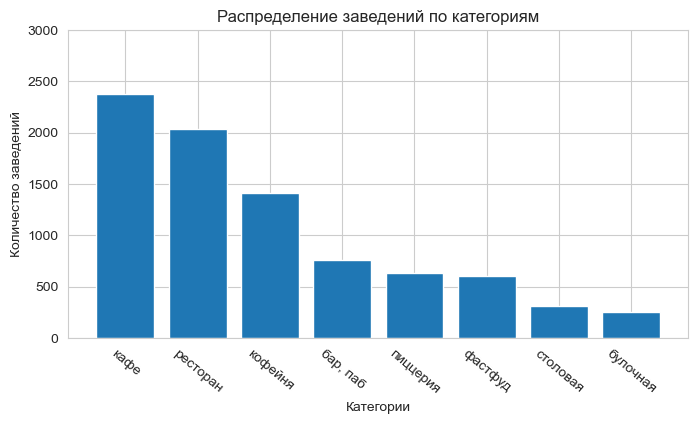

In [43]:
# установим для всех графиков стиль "whitegrid"
sns.set_style('whitegrid')

# зададим размер графика
plt.figure(figsize=(8, 4)) 

# построим столбчатую диаграмму
plt.bar(category_data['category'], category_data['place_counts']) 
plt.xticks(rotation = 320) # перевернем подписи оси X
plt.title("Распределение заведений по категориям") # зададим название для диаграммы
plt.ylabel("Количество заведений") # установим название для оси Y
plt.xlabel("Категории") # установим название для оси X
plt.ylim([0, 3000]) # зададим минимальное и максимальное значения для оси Y
plt.show() # выведем график на экран

Построим также круговую диаграмму.

In [44]:
fig = px.pie(category_data, 
             values=category_data['place_counts'],             
             names=category_data['category'], 
             title="Распределение заведений по категориям")

# выведем на экран полученную диаграмму
fig.show()

Чаще всего в Москве встречаются кафе, рестораны и кофейни – на их долю приходится почти 70% от всего рынка общепита Москвы. Реже всего встречаются булочные и столовые, доля которых составляет примерно 7%.

### Количество посадочных мест по категориям заведений

Посмотрим, как отличаются различные типы заведений в зависимости от количества посадочных мест (на основании информации в столбце `seats`).

In [45]:
# построим таблицу с расчетом различных значений и обновлением индексов (предварительно исключив заклюшки типа 555)
(places[places.seats != 555].groupby('category')
                            .agg({'seats': ['max', 'mean', 'median', 'std']})
                            .reset_index())

category   seats                               
                max        mean median         std
0  бар, паб  1288.0  124.477516   82.0  145.162278
1  булочная   625.0   89.385135   50.0   97.685844
2      кафе  1288.0   97.365653   60.0  117.922464
3   кофейня  1288.0  111.199734   80.0  127.837772
4  пиццерия  1288.0   94.496487   55.0  112.282703
5  ресторан  1288.0  121.892041   86.0  123.792216
6  столовая  1200.0   99.750000   75.5  122.951453
7   фастфуд  1040.0   98.891117   65.0  106.611739

In [46]:
# построим таблицу с расчетом медианного значения, их сортировкой и обновлением индексов
category_and_seats = (places[places.seats != 555].groupby('category')
                                                 .agg({'seats': 'median'})
                                                 .sort_values('seats', ascending=False)
                                                 .reset_index())

# заменим название для столбца "seats"
category_and_seats = category_and_seats.rename(columns={'seats': 'seats_median'})

# выведем на экран полученную таблицу
category_and_seats

,category,seats_median
0,ресторан,86.0
1,"бар, паб",82.0
2,кофейня,80.0
3,столовая,75.5
4,фастфуд,65.0
5,кафе,60.0
6,пиццерия,55.0
7,булочная,50.0


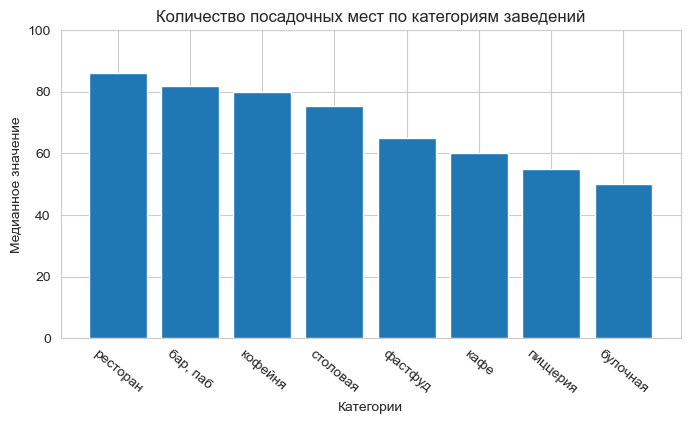

In [47]:
# зададим размер графика
plt.figure(figsize=(8, 4)) 

# строим столбчатую диаграмму
plt.bar(category_and_seats['category'], category_and_seats['seats_median']) 
plt.xticks(rotation = 320) # перевернем подписи оси X
plt.title("Количество посадочных мест по категориям заведений") # зададим название для диаграммы
plt.ylabel("Медианное значение") # установим название для оси Y
plt.xlabel("Категории") # установим название для оси X
plt.ylim([0, 100]) # зададим минимальное и максимальное значения для оси Y
plt.show() # выведем график на экран

Как видим, стандартное отклонение количества посадочных мест (столбец `std`) – существенное (скорей всего, в столбце имеются выбросы), поэтому для анализа количества посадочных мест лучше использовать медиану.

Больше всего посадочных мест в барах, пабах и ресторанах, что можно объяснить тем, что в заведения такого типа приходит приятно провести время, а обслуживание клиентов в них не бывает быстрым. Вслед за ними следуют столовые, которые в определенные часы будних дней принимают большое количество людей.

Заведения, где клиенты поставлены «на поток», имеют меньше посадочных мест, поскольку для них свойственны высокая скорость обслуживания и, как правило, работа с клиентами на «вынос». К таковым можно отнести булочные, пиццерии, кафе и точки быстрого питания.

### Распределение сетевых и несетевых заведений

Посчитаем, сколько в Москве сетевых (признак `1`), а сколько несетевых заведений (признак `0`).

In [48]:
# построим таблицу с подсчетом количества сетевых и несетевых заведений и обновлением индексов
chain = places.groupby('chain')['name'].count().reset_index()

# заменим название для столбца "name"
chain = chain.rename(columns={'name': 'chain_count'})

# выведем на экран полученную таблицу
chain

,chain,chain_count
0,0,5194
1,1,3209


Сменим также обозначение категоризации заведений.

In [49]:
chain.loc[0, 'chain'] = 'сетевое заведение'
chain.loc[1, 'chain'] = 'несетевое заведение'

# проверим корректность смены категоризации
chain

,chain,chain_count
0,сетевое заведение,5194
1,несетевое заведение,3209


Построим круговую диаграмму.

In [50]:
fig = px.pie(chain,
             values=chain['chain_count'],             
             names=chain['chain'], 
             title="Распределение сетевых и несетевых заведений")

# определим размер круговой диаграммы
fig.update_layout(width=500, height=500)

# выведем на экран полученную диаграмму
fig.show()

Больше всего в Москве несетевых заведений – почти 62% (или 5.2 тыс.). Сетевых же, соответственно, 38% (или 3.2 тыс.).

Признание заведения сетевым означает, что их количество должно быть как минимум больше одного. Посмотрим, есть ли в датасете такие заведения, которые являются сетевыми и имеют в Москве лишь одну точку. 

In [51]:
# построим таблицу с подсчетом для каждой сети количества входящих в него заведений
chain_one_and_name = (places[places['chain'] == 1].groupby('name')
                                                  .agg({'address': 'count'})
                                                  .sort_values(by='address'))

# заменим название для столбца "address"
chain_one_and_name = chain_one_and_name.rename(columns={'address': 'count'})

# считаем количество сетевых заведений, которые представлены в Москве лишь единожды
len(chain_one_and_name[chain_one_and_name['count'] == 1])

63

В городе 63 заведения, которые являются сетевыми, но представлены лишь единожды. С одной стороны, необходимо осуществить корректировку их категоризации, но поскольку мы не знаем, присутствуют ли данные заведения вблизи Москвы или в других городах России, а также то, всегда ли заведения одной сети носят одинаковое название, то достаточных оснований для смены их категоризации отсутствуют.

Теперь посмотрим, какие категории заведений чаще всего являются сетевыми. Для этого отфильтруем изначальный датасет по столбцу `chain`, а затем посчитаем количество заведений в разбивке по категориям.

In [52]:
# оставим в датасете только сетевые заведения
chain_one = places[places.chain == 1]

# построит таблицу с подсчетом количества заведений в разбивке по категориям
chain_one = chain_one.pivot_table(index='category', values='name', aggfunc='count') \
                     .sort_values('name', ascending=False) \
                     .reset_index()

# сменим название для столбца "name"
chain_one = chain_one.rename(columns={'name': 'place_counts'})

# выведем полученную таблицу на экран
chain_one

,category,place_counts
0,кафе,780
1,ресторан,730
2,кофейня,721
3,пиццерия,333
4,фастфуд,232
5,"бар, паб",168
6,булочная,157
7,столовая,88


Построим столбчатую диаграмму и посмотрим, какие категории заведений чаще всего являются сетевыми.

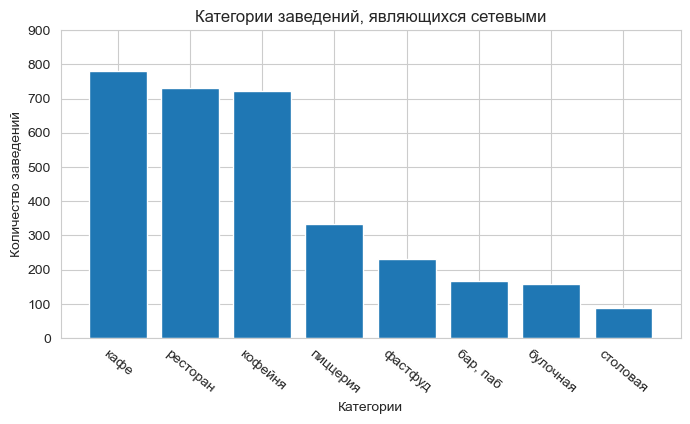

In [53]:
plt.figure(figsize=(8, 4)) # зададим размеры графика

# строим столбчатую диаграмму
plt.bar(chain_one['category'], chain_one['place_counts']) # строим столбчатую диаграмму
plt.xticks(rotation = 320) # перевернем подписи оси X
plt.title("Категории заведений, являющихся сетевыми") # задаем название для диаграммы
plt.ylabel("Количество заведений") # установим название для оси Y
plt.xlabel("Категории") # установим название для оси X
plt.ylim([0, 900]) # зададим минимальное и максимальное значения для оси Y
plt.show() # выведем график на экран

Самыми популярными сетевыми заведениями являются кафе, рестораны и кофейни – на их долю приходится почти 70% всего рынка сетевых заведений Москвы. Реже всего сетевыми являются столовые и булочные – их доля составляет примерно 7.5%.

<a id="24"></a>
### Топ-15 популярных сетей Москвы 

**Если вы перешли сюда по ссылке из раздела 3, то воспользуйтесь обратной [ссылкой](#3).**

Найдем 15 самых популярных сетевых заведений в Москве. Для этого оставим в датасете только сетевые заведения и посчитаем для каждой сети количество входящих в него заведений. 

In [54]:
# построим таблицу с количество заведений внутри сети
most_popular_points = places[places['chain'] == 1].groupby('name')['address'].count() \
                                                  .sort_values(ascending=False) \
                                                  .reset_index() \
                                                  .head(17)

# заменим название для столбца "address"
most_popular_points = most_popular_points.rename(columns={'address': 'place_counts'})

# выведем список из 15 самых популярных сетей
most_popular_points

,name,place_counts
0,шоколадница,121
1,домино'с пицца,79
2,додо пицца,74
3,яндекс лавка,72
4,one price coffee,71
5,cofix,65
6,prime,50
7,хинкальная,44
8,кофепорт,42
9,кулинарная лавка братьев караваевых,39


В полученном списке стоит выделить такие заведения как «хинкальная» и «чайхана». На наш взгляд, нельзя однозначно утверждать, что все заведения с одним из таких названий входят в одну конкретную сеть. По этой причине выше в коде было скорректировано число включенных в таблицу `most_popular_points` заведений (`head(17)`). Теперь же удалим из полученной таблицы заведения с названиями «хинкальная» и «чайхана».

In [55]:
# удалим из полученной таблицы строки с индексами 7 и 11 обновим индексацию
most_popular_points = most_popular_points.drop(index=[7, 11]).reset_index(drop=True)

# посмотрим на обновленный датафрейм
most_popular_points

,name,place_counts
0,шоколадница,121
1,домино'с пицца,79
2,додо пицца,74
3,яндекс лавка,72
4,one price coffee,71
5,cofix,65
6,prime,50
7,кофепорт,42
8,кулинарная лавка братьев караваевых,39
9,теремок,38


Посчитаем долю топ-15 популярных заведений в общем датасете.

In [56]:
# поделим общее количество заведений из топ-15 на общее количество заведений в датасете "places"
round(most_popular_points['place_counts'].sum() * 100 / len(places), 2)

9.41

Перед построением графика также скорректируем длинное название сети «Кулинарная лавка братьев Караваевых», чтобы визуализация выглядела более компактной.

In [57]:
# заменим длинное название сети на более короткое
most_popular_points['name'] = (most_popular_points['name']
                               .replace('кулинарная лавка братьев караваевых', 
                                        'лавка караваевых'))

# посмотрим на обновленный датафрейм
most_popular_points

,name,place_counts
0,шоколадница,121
1,домино'с пицца,79
2,додо пицца,74
3,яндекс лавка,72
4,one price coffee,71
5,cofix,65
6,prime,50
7,кофепорт,42
8,лавка караваевых,39
9,теремок,38


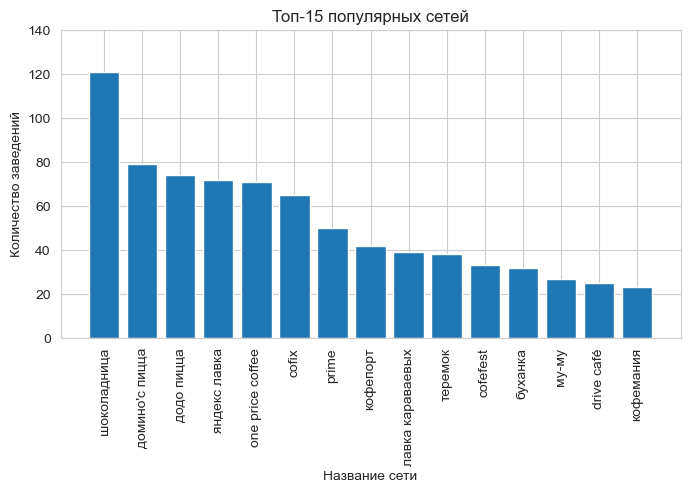

In [58]:
plt.figure(figsize=(8, 4)) # зададим размер графика

# строим столбчатую диаграмму
plt.bar(most_popular_points['name'], most_popular_points['place_counts']) # строим столбчатую диаграмму
plt.xticks(rotation = 90) # перевернем подписи оси X
plt.title("Топ-15 популярных сетей") # зададим название для диаграммы
plt.ylabel("Количество заведений") # установим название для оси Y
plt.xlabel("Название сети") # установим название для оси X
plt.ylim([0, 140]) # зададим минимальное и максимальное значения для оси Y
plt.show() # выведем график на экран

Попробуем выяснить, что объединяет популярные заведения Москвы. 

Для начала создадим сводную таблицу, чтобы узнать, к каким категориям чаще всего относятся отобранные заведения.

In [59]:
top_category_pivot = (places[places['chain'] == 1].pivot_table(index='name', 
                                                              columns='category', 
                                                              values='address', 
                                                              aggfunc='count') 
                                                  .reset_index())

# посмотрим на сформированную сводную таблицу
top_category_pivot.head()

category,name,"бар, паб",булочная,кафе,кофейня,пиццерия,ресторан,столовая,фастфуд
0,1-я креветочная,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN
1,10 идеальных пицц,NaN,NaN,NaN,NaN,NaN,3.0,NaN,NaN
2,18 грамм,NaN,NaN,NaN,3.0,NaN,NaN,NaN,NaN
3,4 сезона,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN
4,7 сэндвичей,NaN,NaN,NaN,4.0,NaN,NaN,NaN,NaN


Заменим пропуски в датафрейме на нули, чтобы добавить к нему новый столбец `total` и посчитать общее количество заведений для каждой сети. 

In [60]:
# заполним пропуски в таблице нулями для проведения арифметических расчетов
top_category_pivot = top_category_pivot.fillna(0)

In [61]:
# добавим новый столбец "total" в датасет с общим количеством заведений для каждой популярной сети
top_category_pivot['total'] = (top_category_pivot[['бар, паб', 
                                                   'булочная', 
                                                   'кафе', 
                                                   'кофейня',
                                                   'пиццерия', 
                                                   'ресторан', 
                                                   'столовая', 
                                                   'фастфуд']] \
                                                 .sum(axis=1))

In [62]:
# отсортируем датасет по количеству заведений в столбце "total" и добавим индексацю, 
# чтобы затем обратиться к ней для удаления соответствующих строк
top_category_pivot = top_category_pivot.sort_values('total', ascending=False).reset_index(drop=True).head(17)

# удалим из полученного датасета информацию о "хинкальной" и "чайхане"
top_category_pivot = top_category_pivot.drop(index=[7, 11]).reset_index(drop=True)

# посмотрим на полученный датасет
top_category_pivot

category,name,"бар, паб",булочная,кафе,кофейня,пиццерия,ресторан,столовая,фастфуд,total
0,шоколадница,0.0,0.0,1.0,119.0,0.0,1.0,0.0,0.0,121.0
1,домино'с пицца,0.0,0.0,0.0,0.0,79.0,0.0,0.0,0.0,79.0
2,додо пицца,0.0,0.0,0.0,0.0,74.0,0.0,0.0,0.0,74.0
3,яндекс лавка,0.0,0.0,0.0,0.0,0.0,72.0,0.0,0.0,72.0
4,one price coffee,0.0,0.0,0.0,71.0,0.0,0.0,0.0,0.0,71.0
5,cofix,0.0,0.0,0.0,65.0,0.0,0.0,0.0,0.0,65.0
6,prime,0.0,0.0,1.0,0.0,0.0,49.0,0.0,0.0,50.0
7,кофепорт,0.0,0.0,0.0,42.0,0.0,0.0,0.0,0.0,42.0
8,кулинарная лавка братьев караваевых,0.0,0.0,39.0,0.0,0.0,0.0,0.0,0.0,39.0
9,теремок,0.0,0.0,0.0,0.0,0.0,36.0,0.0,2.0,38.0


В топ-15 самыми популярными заведениями в Москве являются кофейни (6 позиций), реже – рестораны и кафе (по 3 позиции), после которых следуют пиццерии (2 позиции) и булочная (1 позиция). В топ-15 нет заведений из категорий «бар, паб», «столовая» и «фастфуд».

Изучим средние рейтинги популярных заведений Москвы. 

In [63]:
# создадим датафрейм, состоящий из топ-15 сетевых заведений
top_places_rating = (places[(places.chain == 1) & (places['name'].isin(['шоколадница', 
                                                                        "домино'с пицца", 
                                                                        'додо пицца', 
                                                                        'яндекс лавка',
                                                                        'one price coffee', 
                                                                        'cofix', 
                                                                        'prime', 
                                                                        'кофепорт',
                                                                        'кулинарная лавка братьев караваевых', 
                                                                        'теремок', 
                                                                        'cofefest',
                                                                        'буханка', 
                                                                        'му-му', 
                                                                        'drive café', 
                                                                        'кофемания']))])

# посчитаем средние рейтинги для заведений из топ-15
top_places_rating = (top_places_rating.groupby('name')
                                      .agg({'address': 'count', 'rating': 'mean'})
                                      .sort_values(by='rating', ascending=False))

# переименуем название таблицы
top_places_rating = top_places_rating.rename(columns={'address': 'place_counts', 
                                                      'rating': 'mean_rating'})

# округлим значения рейтингов до двух знаков после запятой
top_places_rating['mean_rating'] = round(top_places_rating['mean_rating'], 2)

# обновим индексацию в датасете
top_places_rating = top_places_rating.reset_index()

top_places_rating

,name,place_counts,mean_rating
0,кофемания,23,4.46
1,буханка,32,4.40
2,кулинарная лавка братьев караваевых,39,4.39
3,додо пицца,74,4.29
4,му-му,27,4.23
5,шоколадница,121,4.18
6,домино'с пицца,79,4.17
7,кофепорт,42,4.15
8,теремок,38,4.12
9,prime,50,4.12


Также как и выше заменим длинное название сети заведений «Кулинарная лавка братьев Караваевых» на более короткое.

In [64]:
# заменим длинное название сети на более короткое
top_places_rating['name'] = top_places_rating['name'].replace('кулинарная лавка братьев караваевых', 'лавка караваевых')

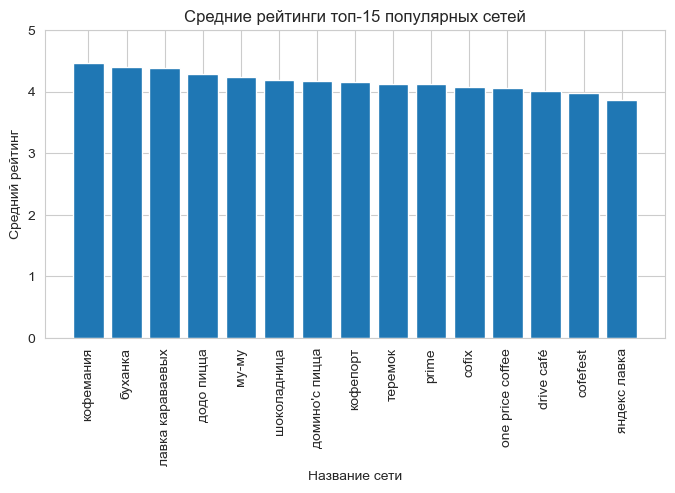

In [65]:
# зададим размер графика
plt.figure(figsize=(8, 4)) 

# построим столбчатую диаграмму
plt.bar(top_places_rating['name'], top_places_rating['mean_rating']) 
plt.xticks(rotation = 90) # перевернем подписи оси X
plt.title("Средние рейтинги топ-15 популярных сетей") # зададим название для диаграммы
plt.ylabel("Средний рейтинг") # установим название для оси Y
plt.xlabel("Название сети") # установим название для оси X
plt.ylim([0, 5]) # зададим минимальное и максимальное значения для оси Y
plt.show() # выведем график на экран

Средние рейтинги топ-15 популярных заведений Москвы, как правило, держатся выше 4 баллов. Стоит выделить сеть «Яндекс Лавка», средний рейтинг которой по состоянию на лето 2022 г. не превысил отметку в 4 балла. 

Для установления более отчетливой связи между популярностью сети и их рейтингом требуется провести дополнительный анализ, в ходе которого можно было бы взглянуть на изменение рейтинга во времени. Это позволило бы, в частности, ответить на вопрос, являются ли стабильными рейтинги популярных сетей. 

Посмотрим на корреляцию популярности сети и уровня цен в заведениях – с учетом того, что количество пропусков в столбце `price` для топ-15 популярных заведений существенно и составляет почти 72%.

In [66]:
# поделим количество заведений из топ-15 с пропусками в столбце "price" на общее количество заведений из топ-15
round(len(places[(places.chain == 1) 
                 & (places.price == 'unknown') 
                 & (places['name'].isin(['шоколадница', 
                                         "домино'с пицца", 
                                         'додо пицца', 
                                         'яндекс лавка',
                                         'one price coffee', 
                                         'cofix', 
                                         'prime', 
                                         'кофепорт',
                                         'кулинарная лавка братьев караваевых', 
                                         'теремок', 
                                         'cofefest',
                                         'буханка', 
                                         'му-му', 
                                         'drive café', 
                                         'кофемания']))]) * 100 
      / most_popular_points['place_counts'].sum(), 
      2)

71.68

In [67]:
# отфильтруем изначальный датафрейм, в котором оставим информацию только о топ-15 популярных заведениях
top_places_price = places[(places.chain == 1) & 
                          (places['name'].isin(['шоколадница', 
                                                "домино'с пицца", 
                                                'додо пицца', 
                                                'яндекс лавка',
                                                'one price coffee', 
                                                'cofix',
                                                'prime',
                                                'кофепорт',
                                                'кулинарная лавка братьев караваевых', 
                                                'теремок', 
                                                'cofefest',
                                                'буханка', 
                                                'му-му', 
                                                'drive café', 
                                                'кофемания']))]

# построим сводную таблицу с подсчетом уровней цен для каждой сети и установим индексацию
top_places_price = (top_places_price.pivot_table(index='name', 
                                                 columns='price', 
                                                 values='address', 
                                                 aggfunc='count') 
                                    .reset_index())

# создадим новый столбец "total_points" с подсчетом количества заведений для каждой сети
top_places_price['total_points'] = top_places_price[['unknown', 
                                                     'выше среднего', 
                                                     'средние', 
                                                     'высокие', 
                                                     'низкие']] \
                                                    .sum(axis=1)

# создадим новый столбец "unknown_percentage" с расчетом доли пропусков для каждой сети
top_places_price['unknown_percentage'] = (top_places_price['unknown'] *100 / 
                                          top_places_price['total_points']).round(1)

# отсортируем полученный датасет по столбцу "unknown_percentage" и обновим индексацию
top_places_price = top_places_price.sort_values(by='unknown_percentage').reset_index(drop=True)

# выведем сформированный датафрейм
top_places_price

price,name,unknown,высокие,выше среднего,низкие,средние,total_points,unknown_percentage
0,кулинарная лавка братьев караваевых,11.0,NaN,NaN,2.0,26.0,39.0,28.2
1,му-му,8.0,NaN,NaN,NaN,19.0,27.0,29.6
2,кофемания,7.0,14.0,1.0,NaN,1.0,23.0,30.4
3,теремок,18.0,NaN,NaN,4.0,16.0,38.0,47.4
4,домино'с пицца,38.0,NaN,NaN,1.0,40.0,79.0,48.1
5,prime,26.0,NaN,NaN,8.0,16.0,50.0,52.0
6,шоколадница,69.0,NaN,2.0,1.0,49.0,121.0,57.0
7,буханка,28.0,NaN,NaN,1.0,3.0,32.0,87.5
8,cofix,58.0,NaN,NaN,4.0,3.0,65.0,89.2
9,додо пицца,66.0,NaN,NaN,NaN,8.0,74.0,89.2


Для сетей, имеющих менее 50-60% пропусков в столбце `price`, цены преимущественно находятся на среднем уровне. Речь идет о таких заведениях как «Лавка Караваевых», «Му-му», «Теремок», «Домино'с пицца», «Prime» и «Шоколадница». 

Для корректности вывода о связи между популярностью и уровнем цен необходимо выяснить, почему клиенты не оставляют в сервисах `Яндекс.Карты` и `Яндекс.Бизнес` отзывы о ценах, а также попробовать отыскать соответствующую информацию на альтернативных  сервисах.

### Административные районы Москвы

Посмотрим, какие административные округи присутствуют в датасете и посчитаем их общее количество.

In [68]:
# выведем названия всех административных округов
places['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

In [69]:
# посчитаем общее количество округов, представленных в датасете
places['district'].nunique()

9

В датасете `places` присутствуют заведения из 9 административных районов Москвы. 

Информация о заведениях в 3 остальных округах Москвы отсутствует. Речь идет о Зеленоградском округе, не имеющем общей границы с Москвой и являющийся, по сути, отдельным городом Зеленоградом, а также Новомосковском и Троицком округах. 

Посмотрим на распределение заведений по административным районам Москвы, в том числе с помощью круговой диаграммы.

In [70]:
# создадим новую таблицу и посчитаем количество заведений в каждом округе 
district_and_places = (places.groupby('district')
                             .agg({'name': 'count'}))

# переименуем название столбца, отсортируем и установим индексацию
district_and_places = (district_and_places.rename(columns={'name': 'places_quantity'})
                                          .sort_values(by='places_quantity', ascending=False) 
                                          .reset_index())

# посмотрим на полученный датафрейм
district_and_places

,district,places_quantity
0,Центральный административный округ,2242
1,Северный административный округ,899
2,Южный административный округ,892
3,Северо-Восточный административный округ,890
4,Западный административный округ,850
5,Восточный административный округ,798
6,Юго-Восточный административный округ,714
7,Юго-Западный административный округ,709
8,Северо-Западный административный округ,409


In [71]:
# построим круговую диаграмму
fig = px.pie(district_and_places,
             values=district_and_places['places_quantity'],             
             names=district_and_places['district'], 
             title="Распределение заведений по административным округам")

# выведем на экран полученную диаграмму
fig.show() 

Посчитаем плотность распределения заведений в каждом из административных районов, поделив количество каждого на площадь округа, а также узнаем, сколько приходится жителей на один объект общепита (данные о площади округов и о количестве проживающих в них людях доступны по [ссылке](https://clck.ru/33uXMW)).

Информацию о площади округов поместим в отдельным датафрейм и затем объединим его с таблицей `district_and_places`.

In [72]:
# создадим словарь с наименованиями округов и их площадью
district_square = {'district': ['Северный административный округ',
                                'Северо-Восточный административный округ',
                                'Северо-Западный административный округ',
                                'Западный административный округ',
                                'Центральный административный округ',
                                'Восточный административный округ',
                                'Юго-Восточный административный округ',
                                'Южный административный округ',
                                'Юго-Западный административный округ'], 
                   'square': [113.73, 
                              101.88,
                              93.28,
                              153.03,
                              66.18,
                              154.84,
                              117.56,
                              131.77,
                              111.36]}

# создадим отдельный датафрейм с названиями округов и их площадью 
district_square = pd.DataFrame(data=district_square)

# посмотрим на полученный датафрейм
district_square

,district,square
0,Северный административный округ,113.73
1,Северо-Восточный административный округ,101.88
2,Северо-Западный административный округ,93.28
3,Западный административный округ,153.03
4,Центральный административный округ,66.18
5,Восточный административный округ,154.84
6,Юго-Восточный административный округ,117.56
7,Южный административный округ,131.77
8,Юго-Западный административный округ,111.36


In [73]:
# создадим словарь с наименованиями округов и количеством людей, проживающих в них
district_people = {'district': ['Северный административный округ',
                                'Северо-Восточный административный округ',
                                'Северо-Западный административный округ',
                                'Западный административный округ',
                                'Центральный административный округ',
                                'Восточный административный округ',
                                'Юго-Восточный административный округ',
                                'Южный административный округ',
                                'Юго-Западный административный округ'], 
                   'people': [1204088, 
                              1437668,
                              1031149,
                              1437153,
                              772258,
                              1512946,
                              1492257,
                              1789371,
                              1431903]}

# создадим отдельный датафрейм с названиями округов и их площадью 
district_people = pd.DataFrame(data=district_people)

# посмотрим на полученный датафрейм
district_people

,district,people
0,Северный административный округ,1204088
1,Северо-Восточный административный округ,1437668
2,Северо-Западный административный округ,1031149
3,Западный административный округ,1437153
4,Центральный административный округ,772258
5,Восточный административный округ,1512946
6,Юго-Восточный административный округ,1492257
7,Южный административный округ,1789371
8,Юго-Западный административный округ,1431903


In [74]:
# объединим таблицы "district_places_square" и "district_square"
places_quantity_per_square_and_people = district_and_places.merge(district_square)

# добавим в таблицу "places_quantity_per_square_and_people" информацию о количестве людей в каждом округе
places_quantity_per_square_and_people = places_quantity_per_square_and_people.merge(district_people)

# посмотрим на полученный датасет
places_quantity_per_square_and_people

,district,places_quantity,square,people
0,Центральный административный округ,2242,66.18,772258
1,Северный административный округ,899,113.73,1204088
2,Южный административный округ,892,131.77,1789371
3,Северо-Восточный административный округ,890,101.88,1437668
4,Западный административный округ,850,153.03,1437153
5,Восточный административный округ,798,154.84,1512946
6,Юго-Восточный административный округ,714,117.56,1492257
7,Юго-Западный административный округ,709,111.36,1431903
8,Северо-Западный административный округ,409,93.28,1031149


Добавим в датафрейм `places_quantity_per_square_and_people` новые столбцы с расчетом количества заведений на 1 кв. м. в округе, а также расчетом количества людей, приходящихся на одно заведение в округе.

In [75]:
# считаем количество заведений на 1 кв. м. в округе
places_quantity_per_square_and_people['places_per_square'] = ((places_quantity_per_square_and_people['places_quantity'] / 
                                                               places_quantity_per_square_and_people['square'])
                                                              .round(2))

# считаем количество людей, приходящихся на одно заведение в каждом из округов
places_quantity_per_square_and_people['people_per_place'] = ((places_quantity_per_square_and_people['people'] / 
                                                              places_quantity_per_square_and_people['places_quantity'])
                                                             .round(2))

# отсортируем датафрейм по столбцу "places_per_square" и обновим индексацию в нем
places_quantity_per_square_and_people = (places_quantity_per_square_and_people.sort_values(by='places_per_square',
                                                                                           ascending=False)
                                                                              .reset_index(drop=True))

# посмотрим на полученный датафрейм
places_quantity_per_square_and_people

,district,places_quantity,square,people,places_per_square,people_per_place
0,Центральный административный округ,2242,66.18,772258,33.88,344.45
1,Северо-Восточный административный округ,890,101.88,1437668,8.74,1615.36
2,Северный административный округ,899,113.73,1204088,7.90,1339.36
3,Южный административный округ,892,131.77,1789371,6.77,2006.02
4,Юго-Западный административный округ,709,111.36,1431903,6.37,2019.61
5,Юго-Восточный административный округ,714,117.56,1492257,6.07,2090.00
6,Западный административный округ,850,153.03,1437153,5.55,1690.77
7,Восточный административный округ,798,154.84,1512946,5.15,1895.92
8,Северо-Западный административный округ,409,93.28,1031149,4.38,2521.15


Покажем на горизонтальной столбчатой диаграмме плотность распределения объектов общепита. Перед этим сократим наименования административных округов.

In [76]:
places_quantity_per_square_and_people.replace('Восточный административный округ', 
                                              'Восточный', 
                                              inplace=True)
places_quantity_per_square_and_people.replace('Восточный административный округ', 
                                              'Восточный',
                                              inplace=True)
places_quantity_per_square_and_people.replace('Западный административный округ', 
                                              'Западный',
                                              inplace=True)
places_quantity_per_square_and_people.replace('Северный административный округ', 
                                              'Северный',
                                              inplace=True)
places_quantity_per_square_and_people.replace('Северо-Восточный административный округ', 
                                              'С.-Восточный',
                                              inplace=True)
places_quantity_per_square_and_people.replace('Северо-Западный административный округ', 
                                              'С.-Западный',
                                              inplace=True)
places_quantity_per_square_and_people.replace('Центральный административный округ', 
                                              'Центральный',
                                              inplace=True)
places_quantity_per_square_and_people.replace('Юго-Восточный административный округ', 
                                              'Ю.-Восточный',
                                              inplace=True)
places_quantity_per_square_and_people.replace('Юго-Западный административный округ', 
                                              'Ю.-Западный',
                                              inplace=True)
places_quantity_per_square_and_people.replace('Южный административный округ', 
                                              'Южный',
                                              inplace=True)

# проверим корректность смены названия административных округов
places_quantity_per_square_and_people

,district,places_quantity,square,people,places_per_square,people_per_place
0,Центральный,2242,66.18,772258,33.88,344.45
1,С.-Восточный,890,101.88,1437668,8.74,1615.36
2,Северный,899,113.73,1204088,7.90,1339.36
3,Южный,892,131.77,1789371,6.77,2006.02
4,Ю.-Западный,709,111.36,1431903,6.37,2019.61
5,Ю.-Восточный,714,117.56,1492257,6.07,2090.00
6,Западный,850,153.03,1437153,5.55,1690.77
7,Восточный,798,154.84,1512946,5.15,1895.92
8,С.-Западный,409,93.28,1031149,4.38,2521.15


<Figure size 1500x1000 with 0 Axes>

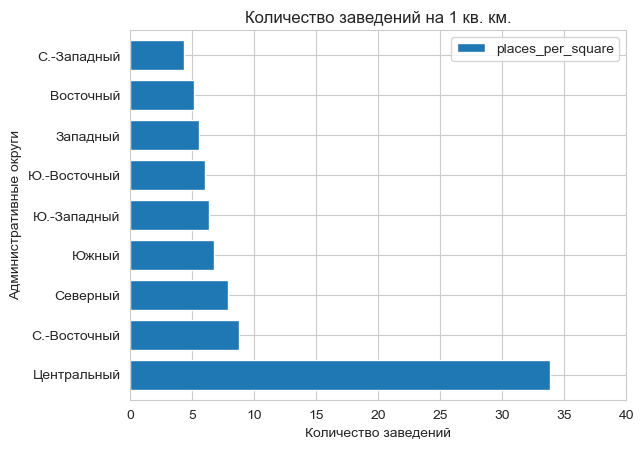

In [77]:
# зададим размер для диаграммы
plt.figure(figsize=(15, 10))

# построим столбчатую диаграмму
places_quantity_per_square_and_people[['district', 
                                       'places_per_square']] \
                                    .plot(x='district', kind='barh', width=0.75)
plt.title("Количество заведений на 1 кв. км.") # зададим название для диаграммы
plt.xlabel("Количество заведений") # установим название для оси Y
plt.ylabel("Административные округи") # установим название для оси X
plt.xlim([0, 40]) # зададим минимальное и максимальное значения для оси Y
plt.show(); # выведем диаграмму на экран

Самым плотным по размещению заведений общепита считается Центральный административный округ – на 1 кв. км. приходится 34 заведения. По соотношению с количеством людей, проживающих в этом округе, на 1 заведение приходится в среднем 344 жителя. Расчетные показатели по данному округу в несколько раз превышают аналогичные показатели по другим округам. При этом важно учитывать, что данный округ, скорей всего, является самым посещаемым, и потому количество людей, которое в среднем обслуживает 1 заведение, будет отличаться от расчетного значения. Таким образом, данный округ можно признать самым конкурентным на всей территории Москвы.

Количество заведений на 1 кв. км. во всех остальных округах Москвы находится в пределах от 4 до 9. Меньше всего подобных заведений в Северо-Западном, Восточном и Западном административных округах. Среднее количество людей, приходящихся на 1 заведение, находится в диапазоне от 1300 до 2500 человек (было бы интересно сопоставить эти расчеты с аналогичными расчетами по другим городам России). 

В рамках дополнительного анализа можно изучить соотношение количества заведений и уровня доходов жителей, проживающих в том или ином районе Москвы. Чем выше уровень благосостояния жителей округа, тем – при прочих равных условиях – выше спрос в том числе на услуги общепита, что, в свою очередь, должно отразиться на увеличении предложения на этом рынке.

Посмотрим на то, как распределены заведения в районах города в разбивке по категориям.

In [78]:
# соберем в отдельный датафрейм информацию о распределении заведений по категориям в каждом округе
places_in_districts = (places.pivot_table(index='district', 
                                          columns='category', 
                                          values='name', 
                                          aggfunc='count') 
                             .sort_values(by='кафе',
                                          ascending=False)
                             .reset_index())

# посмотрим на полученный датафрейм
places_in_districts

category,district,"бар, паб",булочная,кафе,кофейня,пиццерия,ресторан,столовая,фастфуд
0,Центральный административный округ,364,50,464,428,113,670,66,87
1,Юго-Восточный административный округ,38,13,282,89,55,145,25,67
2,Восточный административный округ,53,25,272,105,72,160,40,71
3,Северо-Восточный административный округ,62,28,269,159,68,182,40,82
4,Южный административный округ,68,25,264,131,73,202,44,85
5,Западный административный округ,50,37,238,150,71,218,24,62
6,Юго-Западный административный округ,38,27,238,96,64,168,17,61
7,Северный административный округ,68,39,235,193,77,188,41,58
8,Северо-Западный административный округ,23,12,115,62,40,109,18,30


Для более компактного представления информации на визуализации – сократим в таблице `places_in_districts` наименования округов.

In [79]:
places_in_districts = places_in_districts.replace('Восточный административный округ', 'Восточный')
places_in_districts = places_in_districts.replace('Западный административный округ', 'Западный')
places_in_districts = places_in_districts.replace('Северный административный округ', 'Северный')
places_in_districts = places_in_districts.replace('Северо-Восточный административный округ', 'С.-Восточный')
places_in_districts = places_in_districts.replace('Северо-Западный административный округ', 'С.-Западный')
places_in_districts = places_in_districts.replace('Центральный административный округ', 'Центральный ')
places_in_districts = places_in_districts.replace('Юго-Восточный административный округ', 'Ю.-Восточный')
places_in_districts = places_in_districts.replace('Юго-Западный административный округ', 'Ю.-Западный')
places_in_districts = places_in_districts.replace('Южный административный округ', 'Южный ')

# выведем отредактированный датафрейм на экран
places_in_districts

category,district,"бар, паб",булочная,кафе,кофейня,пиццерия,ресторан,столовая,фастфуд
0,Центральный,364,50,464,428,113,670,66,87
1,Ю.-Восточный,38,13,282,89,55,145,25,67
2,Восточный,53,25,272,105,72,160,40,71
3,С.-Восточный,62,28,269,159,68,182,40,82
4,Южный,68,25,264,131,73,202,44,85
5,Западный,50,37,238,150,71,218,24,62
6,Ю.-Западный,38,27,238,96,64,168,17,61
7,Северный,68,39,235,193,77,188,41,58
8,С.-Западный,23,12,115,62,40,109,18,30


Построим горизонтальную столбчатую диаграмму (`kind='barh'`) с отображением на ней количества заведений по типам общепита. 

<Figure size 1500x1000 with 0 Axes>

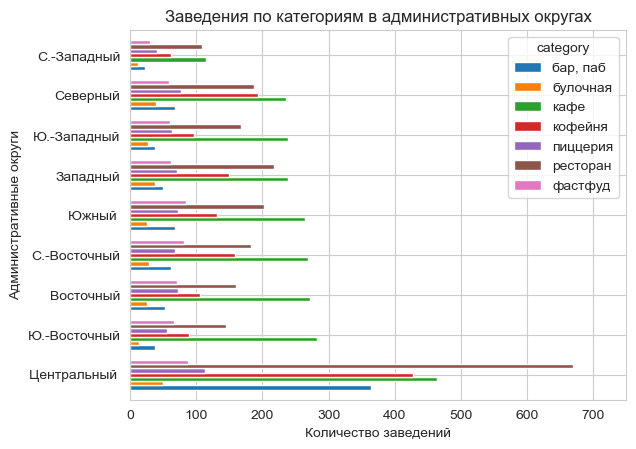

In [80]:
# зададим размер диаграммы
plt.figure(figsize=(15, 10)) 

# строим столбчатую диаграмму
places_in_districts[['district', 
                     'бар, паб', 
                     'булочная', 
                     'кафе', 
                     'кофейня', 
                     'пиццерия', 
                     'ресторан',
                     'фастфуд']] \
                    .plot(x='district', kind='barh', width=0.75)
plt.title("Заведения по категориям в административных округах") # зададим название диаграммы
plt.xlabel("Количество заведений") # установим название для оси Y
plt.ylabel("Административные округи") # установим название для оси X
plt.xlim([0, 750]) # зададим минимальное и максимальное значения для оси Y
plt.show() # выведем диаграмму на экран;

Наибольшее разнообразие заведений в разбивке по категориям зафиксировано в Центральном округе Москвы. Больше всего в этом округе ресторанов (670 объектов), что отличает его от всех остальных округов Москвы, в которых лидирующую позицию уверенно занимают кафе. Косвенно это может свидетельствовать о том, что в Центральном округе проживают наиболее обеспеченные жители Москвы, благостояние и образ жизни которых позволяет поддерживать достаточный спрос в секторе ресторанов (чтобы окончательно в этом убедиться – требуется дополнительно изучить статистику доходов московских жителей в разбивке по округам).

Реже всего во всех округах без исключения можно встретить булочные. За исключением Центрального округа это касается также баров и пабов, спрос на которые, в первую очередь, можно объяснить финансовым положением граждан округа. 

### Средние рейтинги по категориям заведений

Посчитаем средние рейтинги для каждой категории.

In [81]:
places.groupby('category').agg({'rating': 'mean'}).sort_values(by='rating', ascending=False).reset_index()

,category,rating
0,"бар, паб",4.387696
1,пиццерия,4.301264
2,ресторан,4.290402
3,кофейня,4.277282
4,булочная,4.268359
5,столовая,4.211429
6,кафе,4.123896
7,фастфуд,4.050249


Средние рейтинги по типам заведения не сильно отличаются друг от друга – все они находятся в диапазоне от 4.1 до 4.4 баллов. Самый высокий рейтинг принадлежит барам и пабам, а самый низкий – фастфуду и кафе.

Дополнительно посмотрим, в каких округах самые высокие рейтинги заведений без разбивки по категориям.

In [82]:
rating_in_district = (places.groupby('district') 
                            .agg({'rating': 'mean'}) 
                            .sort_values(by='rating', ascending=False) 
                            .reset_index())

# округлим значения рейтингов до двух знаков после запятой
rating_in_district['rating'] = round(rating_in_district['rating'], 2)

# посмотрим на полученный датафрейм
rating_in_district

,district,rating
0,Центральный административный округ,4.38
1,Северный административный округ,4.24
2,Северо-Западный административный округ,4.21
3,Южный административный округ,4.18
4,Западный административный округ,4.18
5,Восточный административный округ,4.17
6,Юго-Западный административный округ,4.17
7,Северо-Восточный административный округ,4.15
8,Юго-Восточный административный округ,4.10


Высокий спрос на услуги общепита в Центральном округе Москвы обеспечивает ей самый высокий рейтинг. Напомним, что этот округ является самым конкурентным, что, в свою очередь, требует обеспечения высокого качества обслуживания для привлечения и удержания клиентов.

Посмотрим на то, как распределены рейтинги внутри округов в разбивке по категориям общепита.

In [83]:
rating_of_category_in_district = (places.pivot_table(index='district', 
                                                     columns='category', 
                                                     values='rating', 
                                                     aggfunc='mean') 
                                        .reset_index())

# округлим все значения в таблице 
rating_of_category_in_district['бар, паб'] = rating_of_category_in_district['бар, паб'].round(2)
rating_of_category_in_district['булочная'] = rating_of_category_in_district['булочная'].round(2)
rating_of_category_in_district['кафе'] = rating_of_category_in_district['кафе'].round(2)
rating_of_category_in_district['кофейня'] = rating_of_category_in_district['кофейня'].round(2)
rating_of_category_in_district['пиццерия'] = rating_of_category_in_district['пиццерия'].round(2)
rating_of_category_in_district['ресторан'] = rating_of_category_in_district['ресторан'].round(2)
rating_of_category_in_district['столовая'] = rating_of_category_in_district['столовая'].round(2)
rating_of_category_in_district['фастфуд'] = rating_of_category_in_district['фастфуд'].round(2)

# отсортируем таблицу по убыванию значений рейтинга и обновим индексацию
rating_of_category_in_district = (rating_of_category_in_district.sort_values(by='бар, паб', 
                                                                             ascending=False)
                                                                .reset_index(drop=True))

# посмотрим на полученный датафрейм
rating_of_category_in_district

category,district,"бар, паб",булочная,кафе,кофейня,пиццерия,ресторан,столовая,фастфуд
0,Центральный административный округ,4.49,4.37,4.30,4.34,4.41,4.42,4.32,4.23
1,Западный административный округ,4.40,4.26,4.08,4.20,4.29,4.26,4.11,3.97
2,Северо-Западный административный округ,4.39,4.28,4.05,4.33,4.34,4.29,4.19,3.95
3,Юго-Западный административный округ,4.35,4.16,4.04,4.28,4.34,4.23,4.24,4.09
4,Северный административный округ,4.33,4.25,4.18,4.29,4.29,4.29,4.22,3.98
5,Восточный административный округ,4.32,4.17,4.10,4.28,4.27,4.19,4.23,4.04
6,Южный административный округ,4.28,4.34,4.09,4.23,4.26,4.21,4.26,4.10
7,Юго-Восточный административный округ,4.20,4.04,4.05,4.23,4.19,4.16,4.10,3.93
8,Северо-Восточный административный округ,4.19,4.34,4.05,4.22,4.26,4.21,4.08,4.03


Большая часть средних рейтингов уверенно находится выше отметки в 4 балла. По всем категориям общепита Центральный округ занимает лидирующую позицию.

Самые низкие рейтинги принадлежат заведениям типа «фастфуд» – в 4 из 9 округов рейтинг таких заведений ниже отметки в 4 балла, одной из причин которого, скорей всего, является высокая текучесть кадров.

### Фоновая картограмма (хороплет) со средним рейтингом заведений

Для построеной фоновой картограммы со средним рейтингом для каждого округа используем ранее сформированный датафрейм `rating_in_district` и файл `admin_level_geomap.geojson` (с кодировкой `ANSI`), в котором хранятся границы районов Москвы. 

In [84]:
# загрузим JSON-файл с границами округов Москвы
state_geo = 'admin_level_geomap.geojson'
    
# установим широту (moscow_lat) и долготу (moscow_lng) для центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создадим карту Москвы
m = Map(location=[moscow_lat, moscow_lng], 
        zoom_start=10)

# создадим хороплет с помощью конструктора Choropleth и добавим его на карту
Choropleth(geo_data = state_geo,
           data = rating_in_district,
           columns = ['district', 'rating'],
           key_on = 'feature.name',
           fill_color = 'YlGn',
           fill_opacity = 0.8,
           legend_name = 'Средний рейтинг заведений по районам',).add_to(m)

# выведем карту на экран
m

### Визуализация заведений на карте (с помощью кластеров средствами библиотеки `folium`)

Посмотрим на распределение заведений общепита на карте Москвы. Для ее построения используем кластеры из библиотеки `folium`, позволяющие собирать маркеры в группы при уменьшении масштаба карты и раскрывать их – при увеличении масштаба.

In [85]:
# установим широту (moscow_lat) и долготу (moscow_lng) для центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создадим карту Москвы
m = Map(location=[moscow_lat, moscow_lng], 
        zoom_start=10)

# создадим пустой кластер и добавим его на карту
marker_cluster = MarkerCluster().add_to(m)

# напишем функцию, которая будет принимать строку датафрейма,
# создаст маркер в текущей точке и добавит его в кластер marker_cluster
def create_clusters(row):
    Marker([row['lat'], row['lng']],
           popup=f"{row['name']} {row['rating']}",).add_to(marker_cluster)

# применим созданную функцию create_clusters() к каждой строке датасета
places.apply(create_clusters, axis=1)

# выведем карту на экран
m

По мере отдаления от центра Москвы количество заведений сокращается. На севере Москвы количество заведений больше, чем в южной части города. 

### Топ-15 улиц по количеству заведений

Найдем топ-15 улиц Москвы по количеству заведений общепита.

In [86]:
# построим таблицу с подсчетом количества заведений для топ-15 улиц
top_streets = (places.groupby('street')
                     .agg({'name': 'count'})
                     .sort_values('name', ascending=False)
                     .reset_index().head(15))

# переименуем столбец "name"
top_streets = top_streets.rename(columns={'name': 'quantity_of_places'})

# посмотрим на полученную таблицу
top_streets

,street,quantity_of_places
0,проспект Мира,183
1,Профсоюзная улица,122
2,проспект Вернадского,108
3,Ленинский проспект,107
4,Ленинградский проспект,95
5,Дмитровское шоссе,88
6,Каширское шоссе,77
7,Варшавское шоссе,76
8,Ленинградское шоссе,70
9,МКАД,65


Посчитаем общее количество заведений на топ-15 улицах, а также долю этих заведений во всем датасете.

In [87]:
# суммируем количество заведений на топ-15 улицах Москвы
top_streets['quantity_of_places'].sum()

1257

In [88]:
# рассчитаем долю заведений на топ-15 улицах Москвы
round(top_streets['quantity_of_places'].sum() * 100 / len(places), 2)

14.96

На топ-15 улицах расположены 15% заведений (или около 1.3 тыс.) от их общего количества в датасете.

Посмотрим на распределение этих заведений на карте.

In [89]:
# отфильтруем первоначальный датасет, оставив в нем улицы из топ-15
places_top_streets = (places[places['street'].isin(['проспект Мира', 
                                                   'Профсоюзная улица', 
                                                   'проспект Вернадского',
                                                   'Ленинский проспект', 
                                                   'Ленинградский проспект',
                                                   'Дмитровское шоссе', 
                                                   'Каширское шоссе', 
                                                   'Варшавское шоссе',
                                                   'Ленинградское шоссе', 
                                                   'МКАД', 
                                                   'Люблинская улица',
                                                   'улица Вавилова', 
                                                   'Кутузовский проспект', 
                                                   'улица Миклухо-Маклая',
                                                   'Пятницкая улица'])] 
                                             .reset_index(drop=True))

# посмотрим на отфильтрованный датасет
places_top_streets.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,donna maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,555.0,0,79.0,Дмитровское шоссе,False
1,заправка,кафе,"Москва, МКАД, 80-й километр, 1",Северный административный округ,вт-сб 09:00–18:00,55.899938,37.517958,4.3,средние,Средний счёт:330 ₽,330.0,555.0,0,555.0,МКАД,False
2,чайхана беш-бармак,ресторан,"Москва, Ленинградское шоссе, 71Б, стр. 2",Северный административный округ,"ежедневно, круглосуточно",55.876908,37.449876,4.4,средние,Средний счёт:350–500 ₽,425.0,555.0,0,96.0,Ленинградское шоссе,True
3,пикочино,пиццерия,"Москва, Дмитровское шоссе, 107к2",Северный административный округ,"пн-чт 11:00–22:00; пт,сб 11:00–23:00; вс 11:00...",55.879390,37.541228,4.5,средние,Средний счёт:300–1500 ₽,900.0,555.0,0,555.0,Дмитровское шоссе,False
4,mafe,кафе,"Москва, МКАД, 78-й километр, 14к1",Северный административный округ,"ежедневно, 10:00–19:00",55.893061,37.501319,3.8,средние,Средний счёт:400–600 ₽,500.0,555.0,0,555.0,МКАД,False


In [90]:
# установим широту (moscow_lat) и долготу (moscow_lng) для центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создадим карту Москвы
m = Map(location=[moscow_lat, moscow_lng], 
        zoom_start=10)

# создадим пустой кластер и добавим его на карту
marker_cluster = MarkerCluster().add_to(m)

# напишем функцию, которая будет принимать строку датафрейма,
# создаст маркер в текущей точке и добавит его в кластер marker_cluster
def create_clusters(row):
    Marker([row['lat'], row['lng']],
           popup=f"{row['name']} {row['category']}",).add_to(marker_cluster)

# применим созданную функцию create_clusters() к каждой строке датасета
places_top_streets.apply(create_clusters, axis=1)

# выведем карту на экран
m

Большая часть заведений, расположенных на топ-15 улиц, находится за пределами центральной части Москвы. Больше всего их в Северном, Западном и Южном округах.

Создадим сводную таблицу, в которой посчитаем количество заведений каждого типа на топ-15 улиц (`places_top_streets_and_category`) и построим столбчатую диаграмму с отображением на ней количества заведений по категориям, для чего используем таблицу `places_top_streets`.

In [91]:
# построим сводную таблицу, в которой отразим количество заведений каждой категории в разбивке по округам
places_top_streets_and_category = places_top_streets.pivot_table(index='street', 
                                                                 columns='category', 
                                                                 values='name', 
                                                                 aggfunc='count')

# добавим в датасет новый столбец с расчетом суммы заведений всех категорий для каждого округа
places_top_streets_and_category['total'] = places_top_streets_and_category[['кафе', 
                                                                            'ресторан', 
                                                                            'кофейня', 
                                                                            'пиццерия', 
                                                                            'бар, паб', 
                                                                            'фастфуд',
                                                                            'булочная', 
                                                                            'столовая']].sum(axis=1)

# отсортируем датасет по количеству заведений в округе и установим новую индексацию
places_top_streets_and_category = (places_top_streets_and_category.sort_values('total', ascending=False)
                                                                 .reset_index())

# добавим новую строку в датасет с расчетом количества заведений каждой категории во всех округах города
places_top_streets_and_category.loc[len(places_top_streets_and_category.index)] = ['ИТОГО:', 
                                                                                   places_top_streets_and_category['бар, паб'].sum(),
                                                                                   places_top_streets_and_category['булочная'].sum(),
                                                                                   places_top_streets_and_category['кафе'].sum(),
                                                                                   places_top_streets_and_category['кофейня'].sum(),
                                                                                   places_top_streets_and_category['пиццерия'].sum(),
                                                                                   places_top_streets_and_category['ресторан'].sum(),
                                                                                   places_top_streets_and_category['столовая'].sum(),
                                                                                   places_top_streets_and_category['фастфуд'].sum(),
                                                                                   places_top_streets_and_category['total'].sum()]


# посмотрим на полученную таблицу
places_top_streets_and_category

category,street,"бар, паб",булочная,кафе,кофейня,пиццерия,ресторан,столовая,фастфуд,total
0,проспект Мира,11.0,4.0,53.0,36.0,11.0,45.0,2.0,21.0,183.0
1,Профсоюзная улица,6.0,4.0,35.0,18.0,15.0,26.0,3.0,15.0,122.0
2,проспект Вернадского,7.0,1.0,25.0,16.0,12.0,33.0,2.0,12.0,108.0
3,Ленинский проспект,10.0,3.0,26.0,23.0,5.0,33.0,5.0,2.0,107.0
4,Ленинградский проспект,15.0,4.0,12.0,25.0,9.0,25.0,3.0,2.0,95.0
5,Дмитровское шоссе,6.0,2.0,23.0,11.0,8.0,24.0,4.0,10.0,88.0
6,Каширское шоссе,2.0,NaN,20.0,16.0,5.0,19.0,5.0,10.0,77.0
7,Варшавское шоссе,6.0,NaN,18.0,14.0,4.0,20.0,7.0,7.0,76.0
8,Ленинградское шоссе,5.0,2.0,13.0,13.0,3.0,26.0,3.0,5.0,70.0
9,МКАД,1.0,NaN,45.0,4.0,NaN,5.0,1.0,9.0,65.0


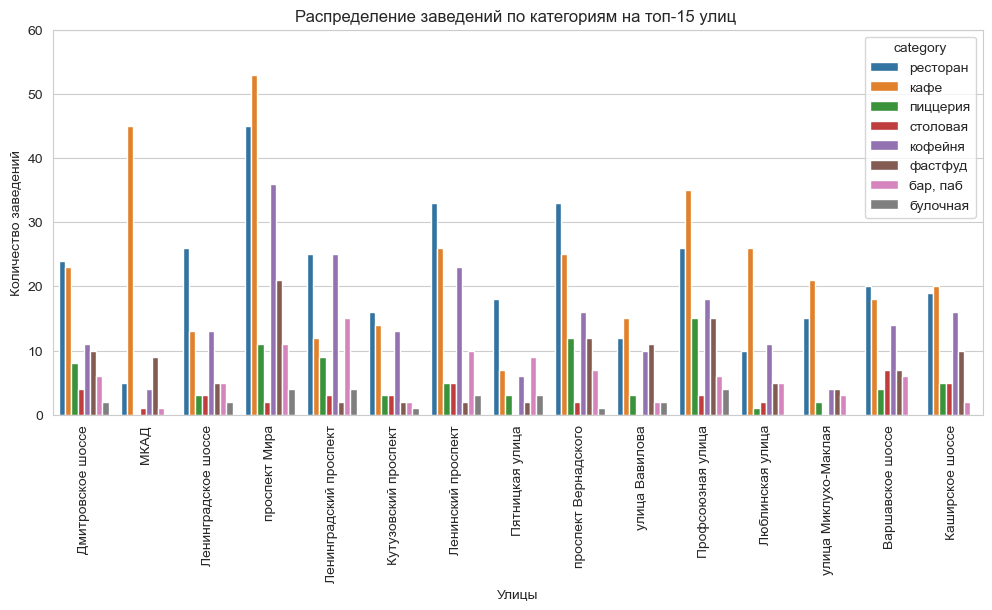

In [92]:
# зададим размеры для диаграммы
plt.figure(figsize=(12, 5)) 

# строим столбчатую диаграмму
sns.countplot(x='street', hue='category', data=places_top_streets)
plt.xticks(rotation=90)
plt.title("Распределение заведений по категориям на топ-15 улиц ") # зададим название для диаграммы
plt.xlabel("Улицы") # установим название для оси Y
plt.ylabel("Количество заведений") # установим название для оси X
plt.ylim([0, 60]) # зададим минимальное и максимальное значения для оси Y
plt.show() # выведем диаграмму на экран;

Чаще всего на указанных улицах расположены кафе и рестораны, реже всего – булочные, отсутствующие на 5 улицах, и столовые, которых нет на 3 улицах.

В качестве дополнительного анализа можно изучить соотношение количества заведений и количества людей, проживающих на топ-15 и на прилегающих к ней улицах (при наличии такой информации), а также соотношение количества заведений и длины каждой улицы, так как – при прочих равных условиях – чем длинее улица, тем больше потенциальных возможностей открытия на ней объекта общепита.

### Улицы с одним объектом общепита

Посчитаем количество улиц, на которых расположено только одно заведение общепита.

In [93]:
# соберем информацию об улицах с одним объектом общепита в отдельную таблицу
# в квадратных скобках после группировки и агрегирования установлена фильтрация
one_places_street = (places.groupby('street').agg({'name': 'count'})
                           [places.groupby('street').agg({'name': 'count'}).name == 1]
                           .reset_index())

# переименуем наименование столбца
one_places_street = one_places_street.rename(columns={'name': 'places_quantity'})

# посчитаем количество таких улиц
len(one_places_street)

458

Посчитаем долю таких улиц в общем количестве улиц, а также долю заведений на этих улицах во всем датасете.

In [94]:
# считаем долю улиц с одним заведением общепита
round(len(one_places_street) / places['street'].nunique() * 100, 2)

31.63

In [95]:
# считаем долю заведений на этих улицах
round(len(one_places_street) / len(places) * 100, 2)

5.45

Примерно на трети улиц, представленных в датасете, расположен только один объект общепита. Суммарная доля таких объектов во всем датасете составляет 5,5%.

Попробуем понять, что объединяет заведения на этих улицах. Перед этим отфильтруем изначальный датасет, оставив в нем информацию только о 458 заведениях.

In [96]:
# осуществим фильтрацию изначального датасета и обновим индексацию
one_places_street = (places[places['street'].isin(one_places_street['street'].unique())]
                                            .reset_index(drop=True))

# посмотрим на первые пять строк отфильтрованного датасета
one_places_street.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,дом обеда,столовая,"Москва, улица Бусиновская Горка, 2",Северный административный округ,пн-пт 08:30–18:30; сб 10:00–20:00,55.885890,37.493264,4.1,средние,Средний счёт:300–500 ₽,400.0,555.0,0,180.0,улица Бусиновская Горка,False
1,7/12,кафе,"Москва, Прибрежный проезд, 7",Северный административный округ,"ежедневно, 10:00–22:00",55.876805,37.464934,4.5,unknown,unknown,555.0,555.0,0,555.0,Прибрежный проезд,False
2,в парке вкуснее,кофейня,"Москва, парк Левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,unknown,unknown,555.0,555.0,1,555.0,парк Левобережный,False
3,coffeekaldi's,кофейня,"Москва, Угличская улица, 13, стр. 8",Северо-Восточный административный округ,"ежедневно, 09:00–22:00",55.900316,37.570558,4.1,средние,Средний счёт:500–800 ₽,650.0,555.0,1,555.0,Угличская улица,False
4,чебуречная история,кофейня,"Москва, ландшафтный заказник Лианозовский",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.899845,37.570488,4.9,unknown,unknown,555.0,555.0,1,555.0,ландшафтный заказник Лианозовский,False


Посчитаем количество сетевых и несетевых заведений в датасете `one_places_street`, а также посмотрим на их категории.

In [97]:
# посчитаем количество сетевых и несетвых заведений 
one_places_street_сhain = one_places_street.groupby('chain').agg({'name': 'count'})

# переименуем столбец в таблице
one_places_street_сhain = one_places_street_сhain.rename(columns={'name': 'places_quantity'})

# рассчитаем долю сетевых и несетевых объектов
one_places_street_сhain['percent'] = (one_places_street_сhain['places_quantity'] * 100 /
                                      one_places_street_сhain['places_quantity'].sum()).round(2)

# выведем полученную таблицу на экран
one_places_street_сhain

,places_quantity,percent
chain,,
0,325,70.96
1,133,29.04


In [98]:
# посчитаем количество заведений различных категорий
one_places_street_category= one_places_street.groupby('category').agg({'name': 'count'})

# переименуем столбец в таблице
one_places_street_category = one_places_street_category.rename(columns={'name': 'places_quantity'})

# рассчитаем долю заведений каждой категории
one_places_street_category['percent'] = (one_places_street_category['places_quantity'] * 100 /
                                         one_places_street_category['places_quantity'].sum()).round(2)

# выведем полученную таблицу на экран
one_places_street_category.sort_values('percent', ascending=False)

,places_quantity,percent
category,,
кафе,160,34.93
ресторан,93,20.31
кофейня,84,18.34
"бар, паб",39,8.52
столовая,36,7.86
фастфуд,23,5.02
пиццерия,15,3.28
булочная,8,1.75


Узнаем, как распределены заведения на этих улицах по административным округам.

In [99]:
# посчитаем количество заведений по округам
one_places_street_district = one_places_street.groupby('district').agg({'name': 'count'})

# переименуем столбец в таблице
one_places_street_district = one_places_street_district.rename(columns={'name': 'places_quantity'})

# рассчитаем долю заведений в каждой округе
one_places_street_district['percent'] = (one_places_street_district['places_quantity'] * 100 /
                                         one_places_street_district['places_quantity'].sum()).round(2)

# выведем полученную таблицу на экран
one_places_street_district.sort_values('percent', ascending=False)

,places_quantity,percent
district,,
Центральный административный округ,145,31.66
Северо-Восточный административный округ,55,12.01
Восточный административный округ,52,11.35
Северный административный округ,52,11.35
Южный административный округ,43,9.39
Юго-Восточный административный округ,39,8.52
Западный административный округ,35,7.64
Северо-Западный административный округ,19,4.15
Юго-Западный административный округ,18,3.93


Также посмотрим на распределение цен и узнаем, как распределены рейтинги заведений.

In [100]:
# посчитаем количество заведений в зависимости от уровня цен
one_places_street_price = one_places_street.groupby('price').agg({'name': 'count'})

# переименуем столбец в таблице
one_places_street_price = one_places_street_price.rename(columns={'name': 'places_quantity'})

# рассчитаем долю заведений в разбивке по уровню цен
one_places_street_price['percent'] = (one_places_street_price['places_quantity'] * 100 /
                                      one_places_street_price['places_quantity'].sum()).round(2)

# выведем полученную таблицу на экран
one_places_street_price.sort_values('percent', ascending=False)

,places_quantity,percent
price,,
unknown,276,60.26
средние,120,26.20
выше среднего,29,6.33
высокие,22,4.80
низкие,11,2.40


Рассчитаем количество заведений с рейтингами выше 4, от 3 до 4, ниже 3. 

In [101]:
one_places_street_rating = one_places_street.groupby('rating').agg({'name': 'count'}).reset_index()

one_places_street_rating = one_places_street_rating.rename(columns={'name': 'places_quantity'})

print('количество заведений с рейтингом 4 и выше –', 
      one_places_street_rating[one_places_street_rating.rating >= 4]['places_quantity'].sum())

print('количество заведений с рейтингом от 3 до 4 –',
      one_places_street_rating[(one_places_street_rating.rating >= 3) & 
                               (one_places_street_rating.rating < 4)]
                              ['places_quantity'].sum())

print('количество заведений с рейтингом ниже 3 –',
      one_places_street_rating[one_places_street_rating.rating < 3]
                              ['places_quantity'].sum())

количество заведений с рейтингом 4 и выше – 387
количество заведений с рейтингом от 3 до 4 – 60
количество заведений с рейтингом ниже 3 – 11


Около 70% всех заведений являются несетевыми, чаще всего – это кафе, рестораны или кофейни (74%). Большая часть этих объектов не не содержат информацию об уровне цен (таковых около 60%), а в заведениях, имеющих такую информацию, чаще всего цены находятся на среднем уровне. Больше всего таких заведений расположено в центре и на севере Москвы. 

### Медиана среднего чека

Рассчитаем медианное значение среднего чека (`middle_avg_bill`) для каждого округа Москвы. Перед этим исключим из расчета заглушки 555, которыми были заполнены пропуски в датасете, доля которых составляет 55%.

In [102]:
median_middle_avg_bill = (places[places.middle_avg_bill != 555].groupby('district')
                                                               .agg({'middle_avg_bill': 'median'})
                                                               .sort_values('middle_avg_bill', ascending=False)
                                                               .reset_index())

# сменим названия столбца в таблице
median_middle_avg_bill = median_middle_avg_bill.rename(columns={'middle_avg_bill': 
                                                                'median_middle_avg_bill'})

# посмотрим на полученную таблицу
median_middle_avg_bill

,district,median_middle_avg_bill
0,Западный административный округ,1000.0
1,Центральный административный округ,1000.0
2,Северо-Западный административный округ,700.0
3,Северный административный округ,650.0
4,Юго-Западный административный округ,600.0
5,Восточный административный округ,575.0
6,Северо-Восточный административный округ,500.0
7,Южный административный округ,500.0
8,Юго-Восточный административный округ,450.0


Построим фоновую картограмму с полученными значениями. 

In [103]:
# установим широту (moscow_lat) и долготу (moscow_lng) для центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создадим карту Москвы
m = Map(location=[moscow_lat, moscow_lng], 
        zoom_start=10)

# создадим хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(geo_data = state_geo,
           data = median_middle_avg_bill,
           columns = ['district', 'median_middle_avg_bill'],
           key_on = 'feature.name',
           fill_color = 'YlGn',
           fill_opacity = 0.8,
           legend_name = 'Медианна среднего чека',).add_to(m)

# выведем карту на экран
m

Самые высокие цены зафиксированы в Центральном и Западном округах, ниже всего – в Юго-Восточном, Северо-Восточном и Южном округах. 

Такой расчет медианы среднего чека является укрупненным, поскольку не учитывает тип заведения, и носит предположительный характер, так как для большей части заведений в датасете отсутствует информация о среднем чеке.

Дополнительно рассчитаем медиану среднего чека для кафе, ресторанов и кофеен, доля которых составляет почти 70% (для заведений такого типа информация о среднем чеке отсутствует в 66% случаях).

In [104]:
# отфильтруем первоначальный датасет по категориям и уберем из него заглушки
single_median_middle_avg_bill = places[(places.middle_avg_bill != 555) &
                                       ((places.category == 'кафе') |
                                        (places.category == 'ресторан') |
                                        (places.category == 'кофейня'))]

# посчитаем медиану среднего чека по категориям для каждого округа
single_median_middle_avg_bill = single_median_middle_avg_bill.pivot_table(index='district',
                                                                          columns='category',
                                                                          values='middle_avg_bill',
                                                                          aggfunc='median')

# отсортируем значения в таблице и обновим индексацию
single_median_middle_avg_bill = (single_median_middle_avg_bill.sort_values('кафе', ascending=False)
                                                              .reset_index())

# сократим наименования округов 
single_median_middle_avg_bill = single_median_middle_avg_bill.replace('Восточный административный округ', 
                                                                      'Восточный')
single_median_middle_avg_bill = single_median_middle_avg_bill.replace('Западный административный округ', 
                                                                      'Западный')
single_median_middle_avg_bill = single_median_middle_avg_bill.replace('Северный административный округ', 
                                                                      'Северный')
single_median_middle_avg_bill = single_median_middle_avg_bill.replace('Северо-Восточный административный округ', 
                                                                      'С.-Восточный')
single_median_middle_avg_bill = single_median_middle_avg_bill.replace('Северо-Западный административный округ', 
                                                                      'С.-Западный')
single_median_middle_avg_bill = single_median_middle_avg_bill.replace('Центральный административный округ', 
                                                                      'Центральный ')
single_median_middle_avg_bill = single_median_middle_avg_bill.replace('Юго-Восточный административный округ', 
                                                                      'Ю.-Восточный')
single_median_middle_avg_bill = single_median_middle_avg_bill.replace('Юго-Западный административный округ', 
                                                                      'Ю.-Западный')
single_median_middle_avg_bill = single_median_middle_avg_bill.replace('Южный административный округ', 
                                                                      'Южный ')

# посмотрим на полученную таблицу
single_median_middle_avg_bill

category,district,кафе,кофейня,ресторан
0,Центральный,700.0,500.0,1250.0
1,С.-Западный,650.0,325.0,1250.0
2,Западный,625.0,600.0,1300.0
3,Южный,600.0,387.5,975.0
4,Северный,550.0,325.0,1187.5
5,С.-Восточный,475.0,325.0,837.5
6,Восточный,450.0,400.0,1000.0
7,Ю.-Западный,450.0,375.0,1050.0
8,Ю.-Восточный,400.0,250.0,925.0


<Figure size 1500x1000 with 0 Axes>

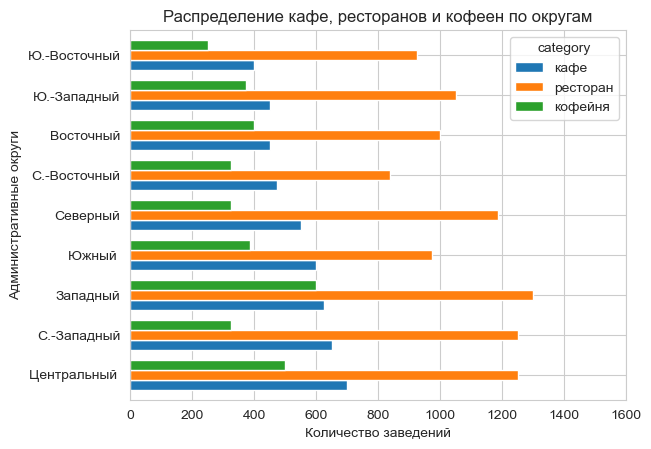

In [105]:
# зададим размер диаграммы
plt.figure(figsize=(15, 10)) 

# построим столбчатую диаграмму
single_median_middle_avg_bill[['district', 
                               'кафе', 
                               'ресторан',
                              'кофейня']] \
                    .plot(x='district', kind='barh', width=0.75)
plt.title("Распределение кафе, ресторанов и кофеен по округам") # зададим название диаграммы
plt.xlabel("Количество заведений") # установим название для оси Y
plt.ylabel("Административные округи") # установим название для оси X
plt.xlim([0, 1600]) # зададим минимальное и максимальное значения для оси Y
plt.show() # выведем название диаграммы;

Средний чек в кофейнях и ресторанах Западного округа, как правило, выше, чем в остальных округах. Максимум среднего чека в кафе зафиксирован в Центральном округе, в ресторанах и кофейнях этого округа – средний чек немного ниже, чем в Западном. В Юго-Восточном и Северо-Восточном округах зафиксированы самые низкие цены в заведениях отобранных категориях. 

### Сравнение успешных и неуспешных заведений

Попробуем выявить иные взаимосвязи между различными параметрами заведений. 

Выясним, какие есть различия между успешными и неуспешными заведениями. Успешными будем считать объекты, рейтинг которых не ниже четырех баллов, а неуспешными – имеющими рейтинг ниже 3.

(В скобках заметим, что более объективным критерием успешности предприятия являются финансовые показатели, такие как ее рыночная стоимость, чистая прибыль, нагрузка на капитал.)

Построим таблицу, в которой будет отражена информация об успешных и неуспешных заведениях по категориям, а также посчитаем их общее количество и долю во всем датасете.

In [106]:
# отфильтруем информацию о неуспешных заведениях
unsuccessful_places = places[places.rating < 3]

# сгруппируем информацию по категориям и посчитаем количество для каждой из них
unsuccessful_places_category = (unsuccessful_places.groupby('category').agg({'name': 'count'})
                                                                       .reset_index())

# переименуем столбец в таблице
unsuccessful_places_category = unsuccessful_places_category.rename(columns={'name': 'below_three_rating'})

# посчитаем долю заведений по категориям
unsuccessful_places_category['below_three_rating, %'] = (unsuccessful_places_category['below_three_rating'] * 100 /
                                                         unsuccessful_places_category['below_three_rating']
                                                        .sum()).round(2)

# посмотрим на полученную таблицу
unsuccessful_places_category

,category,below_three_rating,"below_three_rating, %"
0,"бар, паб",8,3.81
1,булочная,2,0.95
2,кафе,107,50.95
3,кофейня,16,7.62
4,пиццерия,8,3.81
5,ресторан,32,15.24
6,столовая,6,2.86
7,фастфуд,31,14.76


In [107]:
# отфильтруем информацию об успешных заведениях
successful_places = places[places.rating >= 4]

# сгруппируем информацию по категориям и посчитаем количество для каждой из них
successful_places_category = successful_places.groupby('category').agg({'name': 'count'}).reset_index()

# переименуем столбец в таблице
successful_places_category = successful_places_category.rename(columns={'name': 'above_four_rating'})

# посчитаем долю заведений по категориям
successful_places_category['above_four_rating, %'] = (successful_places_category['above_four_rating'] * 100 /
                                                      successful_places_category['above_four_rating']
                                                     .sum()).round(2)

# посмотрим на полученную таблицу
successful_places_category

,category,above_four_rating,"above_four_rating, %"
0,"бар, паб",724,10.01
1,булочная,226,3.12
2,кафе,1834,25.35
3,кофейня,1275,17.63
4,пиццерия,598,8.27
5,ресторан,1865,25.78
6,столовая,271,3.75
7,фастфуд,441,6.10


In [108]:
# считаем количество неуспешных заведений
print('количество неуспешных заведений –', unsuccessful_places_category['below_three_rating'].sum())

# считаем долю неуспешных заведений
print('доля неуспешных заведений –', round(unsuccessful_places_category['below_three_rating'].sum() * 100 / 
                                           len(places), 2))

количество неуспешных заведений – 210
доля неуспешных заведений – 2.5


In [109]:
# считаем количество успешных заведений
print('количество успешных заведений –', successful_places_category['above_four_rating'].sum())

# считаем долю успешных заведений
print('доля успешных заведений –', round(successful_places_category['above_four_rating'].sum() * 100 /  
                                         len(places), 2))

количество успешных заведений – 7234
доля успешных заведений – 86.09


Большая часть объектов, представленных в датасете, можно признать успешными – таковых 86%. Доля неуспешных составляет 2.5% или 210 заведений.

Объединим таблицы с успешными и неуспешными заведениями в один датасет и построим столбчатую диаграмму.

In [110]:
# объединим две таблицы в одну
successful_and_unsuccessful_places_category = unsuccessful_places_category.merge(successful_places_category)

# отсортируем значения в таблице
successful_and_unsuccessful_places_category = successful_and_unsuccessful_places_category.sort_values(by='below_three_rating',
                                                                                                      ascending=False)

# посмотрим на объединенную таблицу
successful_and_unsuccessful_places_category

,category,below_three_rating,"below_three_rating, %",above_four_rating,"above_four_rating, %"
2,кафе,107,50.95,1834,25.35
5,ресторан,32,15.24,1865,25.78
7,фастфуд,31,14.76,441,6.10
3,кофейня,16,7.62,1275,17.63
0,"бар, паб",8,3.81,724,10.01
4,пиццерия,8,3.81,598,8.27
6,столовая,6,2.86,271,3.75
1,булочная,2,0.95,226,3.12


<Figure size 1500x1000 with 0 Axes>

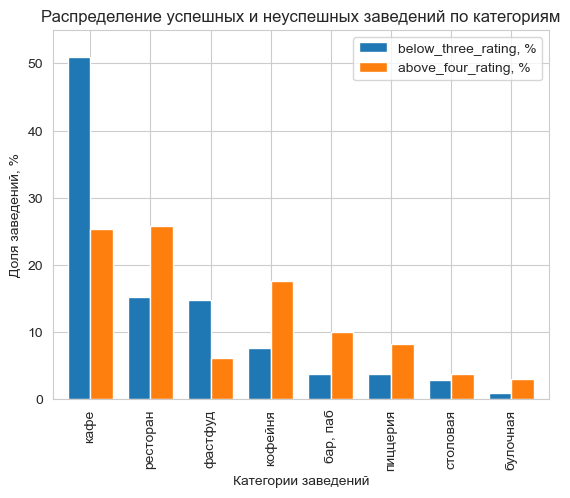

In [111]:
# зададим размер диаграммы
plt.figure(figsize=(15, 10)) 

# построим столбчатую диаграмму
successful_and_unsuccessful_places_category[['category', 
                                             'below_three_rating, %',
                                             'above_four_rating, %']] \
                                          .plot(x='category', kind='bar', width=0.75)
plt.title("Распределение успешных и неуспешных заведений по категориям") # зададим название диаграммы
plt.ylabel("Доля заведений, %") # установим название для оси Y
plt.xlabel("Категории заведений") # установим название для оси X
plt.ylim([0, 55]) # зададим минимальное и максимальное значения для оси Y
plt.show(); # выведем диаграмму на экран

Среди успешных заведений таковыми чаще всего являются рестораны и кофейни. В свою очередь, неуспешными, как правило, становятся кафе, доля которых составляет 51% (то есть распределение неуспешных заведений менее равномерное), и фастфуд. 

Сравним успешные и неуспешные заведения по размеру среднего чека. Перед этим исключим из датафрейма «заглушки» типа `555` в столбце `avg_bill`.

In [112]:
# отфильтруем первоначальный датасет по рейтингу и исключим «заглушки» в столбце middle_avg_bill
unsuccessful_places_middle_avg_bill = places[(places.rating < 3) & (places.middle_avg_bill != 555)]

# рассчитаем медианное значение среднего чека для неуспешных объектов
unsuccessful_places_middle_avg_bill['middle_avg_bill'].median()

460.0

In [113]:
# отфильтруем первоначальный датасет по рейтингу и исключим «заглушки» в столбце middle_avg_bill
successful_places = places[(places.rating >= 4) & (places.middle_avg_bill != 555)]

# рассчитаем медианное значение среднего чека для успешных объектов
successful_places['middle_avg_bill'].median()

750.0

Дополнительно посчитаем долю пропусков в столбце `middle_avg_bill` для успешных и неуспешных заведений.

In [114]:
# посчитаем долю пропусков в столбце middle_avg_bill для неуспешных заведений
round(len(places[(places.rating < 3) & (places.middle_avg_bill == 555)]) * 100 / 
      len(places[places.rating < 3]), 2)

87.62

In [115]:
# посчитаем долю пропусков в столбце middle_avg_bill для успешных заведений
round(len(places[(places.rating >= 4) & (places.middle_avg_bill == 555)]) * 100 / 
      len(places[places.rating >= 4]), 2)

59.72

In [116]:
# сопоставим медианные значения среднего чека и округлим до двух знаков после запятой
round(successful_places['middle_avg_bill'].median() * 100 / 
      unsuccessful_places['middle_avg_bill'].median(), 
      2)

135.14

Средний чек в успешных заведениях на 63% больше, чем в неуспешных. Но навряд ли такую оценку можно считать более или менее репрезентативной, поскольку доля пропусков для обеих групп существенна, а разница между долями пропусков для успешных и неуспешных заведений сильно отличается.

Посмотрим на то, сколько сетевых и несетевых заведений (столбец `chain`) среди успешных и неуспешных предприятий.

In [117]:
# фильтруем датасет, оставляя в нем только неуспешные предприятия
unsuccessful_places_chain = places[(places.rating < 3)]

unsuccessful_places_chain = unsuccessful_places_chain.groupby('chain').agg({'name': 'count'})

unsuccessful_places_chain = unsuccessful_places_chain.rename(columns={'name': 'places_count'})

unsuccessful_places_chain['places_count, %'] = (unsuccessful_places_chain['places_count'] * 100 / 
                                               unsuccessful_places_chain['places_count'].sum()).round(2)

unsuccessful_places_chain

,places_count,"places_count, %"
chain,,
0,142,67.62
1,68,32.38


In [118]:
# фильтруем датасет, оставляя в нем только успешные предприятия
successful_places_chain = places[(places.rating >= 4)]

successful_places_chain = successful_places_chain.groupby('chain').agg({'name': 'count'})

successful_places_chain = successful_places_chain.rename(columns={'name': 'places_count'})

successful_places_chain['places_count, %'] = (successful_places_chain['places_count'] * 100 / 
                                              successful_places_chain['places_count'].sum()).round(2)

successful_places_chain

,places_count,"places_count, %"
chain,,
0,4422,61.13
1,2812,38.87


Можно признать, что распределение сетевых и несетевых заведений в обеих группах существенно не отличаются друг от друга.

Посмотрим, как расположены неуспешные объекты на карте города.

In [119]:
# установим широту (moscow_lat) и долготу (moscow_lng) для центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создадим карту Москвы
m = Map(location=[moscow_lat, moscow_lng], 
        zoom_start=10)

# создадим пустой кластер и добавим его на карту
marker_cluster = MarkerCluster().add_to(m)

# напишем функцию, которая будет принимать строку датафрейма,
# создаст маркер в текущей точке и добавит его в кластер marker_cluster
def create_clusters(row):
    Marker([row['lat'], row['lng']],
           popup=f"{row['name']} {row['category']}",).add_to(marker_cluster)

# применим созданную функцию create_clusters() к каждой строке датасета
unsuccessful_places.apply(create_clusters, axis=1)

# выведем карту на экран
m

Большая часть неуспешных заведений находится по периметру города. В Центральном округе Москвы таковых практически нет. 

### Краткие выводы по итогам исследования данных

Около 70% заведений в Москве представлены кафе, ресторанами и кофейнями. Меньше всего в городе булочных и столовых, доля которых составляет 7%.

Заведения, где клиенты поставлены «на поток», как правило, имеют меньше посадочных мест, поскольку таким объектам свойственна высокая скорость обслуживания и, как правило, работа с клиентами «на вынос»: к таковым можно отнести булочные, пиццерии, кафе и точки быстрого питания. Больше всего посадочных мест в барах, пабах и ресторанах, что можно объяснить временем обслуживания в таких заведениях, а также тем, что люди целенаправленно приходят туда для проведения своего досуга.

Соотношение сетевых и несетевых заведений находится на уровне 40% и 60% соответственно. Среди сетевых чаще встречаются кафе, рестораны и кофейни (около 70%), реже – столовые и булочные (около 8%).

15 самых популярных сетей Москвы (по количеству заведений) занимают почти 10% всего рынка общепита. Их рейтинги выше 4 баллов (за исключением «Яндекс Лавки»), а цены, как правило, находятся на среднем уровне (в 72% случаях информация о ценах в датасете отсутствует). Больше всего в топ-15 кофеен – 6 объектов, ресторанов и кафе – по 3 объекта.

Центральный округ является самым конкурентным – на ее долю приходится четверть всех заведений в городе. Несмотря на минимальные значения площади и численности житилей, в этом округе на 1 кв. км. приходится 34 заведения, а на один объект общепита – 344 жителя (это многократно превышает аналогичные показатели по другим округам). В остальных 8 округах Москвы на 1 кв. км. приходится от 4 до 9 заведений, а на один объект общепита – 1300-2500 жителей. 

Отметим, что Центральный округ – единственный округ Москвы, в котором лидирующую позицию занимают рестораны. Во всех остальных округах эта позиция принадлежит кафе. По мере отдаления от центра города количество заведений в целом сокращается. 

Высокий спрос на услуги общепита в Центральном округе повышает требования к заведениям, расположенным на этой территории, что обеспечивает им высокие рейтинги во всей Москве (это касается как сводного показателя рейтинга, так и в разбивке по категориям). Самые низкие рейтинги принадлежат заведениям в Юго-Восточном и Северо-Восточном округах. Самой низкорейтинговой категорией общепита признаны точки быстрого питания – в 4 округах из 9 рейтинг ниже 4 баллов. 

На топ-15 улиц (по количеству размещенных на них заведений) чаще всего расположены кафе и рестораны (около 54%), реже – булочные и столовые (5.3%): на 5 улицах отсутствуют булочные, а на 3 – столовые.

Улицы, на которых расположено только одно заведение, составляют примерно треть от общего числа улиц, представленных в датасете. Высокая плотность таких улиц зафиксирована в Центральном и Северо-Восточном округах Москвы. В 70% случаях на этих улицах находятся несетевые объекты.

Самые высокие цены установлены в заведениях Центрального и Западного округов. В свою очередь, самые низкие цены зафиксированы в в Юго-Восточном и Северо-Восточном округах (доля пропусков с оценкой среднего чека достигает 63%).

Заведения с рейтингом ниже 3 баллов находятся преимущественно по периметру города. Их доля несущественна – около 2.5% (или 210 объектов), половина из которых представлена кафе. Распределение сетевых и несетевых заведений не очень отличается от общего распределения заведений по данному критерию – 32% против 68%. Цены в неуспешных объектах общепита на 63% ниже, чем в успешных, имеюших рейтинг выше 4 баллов.

## Детализация исследования: открытие кофейни

**Для возврата к оглавлению нажмите [сюда](#title).**

Посчитаем, сколько кофеен в датасете, и какова их доля.

In [120]:
# сохраним информацию о кофейнях в переменную и обновим индексацию
places_coffee_house = places[places.category == 'кофейня'].reset_index(drop=True)

# считаем количество кофеен в датасете
len(places_coffee_house)

1413

In [121]:
# посчитаем долю кофеен среди всех категорий заведений
round(len(places_coffee_house) * 100 / len(places), 2)

16.82

В датасете представлено около 1.4 тыс. кофеен или почти 17% от общего количества заведений.

Посмотрим, как распределены кофейни по административным округам.

In [122]:
# собираем новый датафрейм, группируя данные по административным округам
places_coffee_house_in_districts = (places_coffee_house.groupby('district')
                                                       .agg({'name': 'count'})
                                                       .sort_values('name', ascending=False)
                                                       .reset_index())

# сменим название столбца в датасете
places_coffee_house_in_districts = places_coffee_house_in_districts.rename(columns={'name': 
                                                                                    'places_quantity'})

# добавялем новый столбец в датасет и рассчитываем его значения
places_coffee_house_in_districts['places_share, %'] = round(places_coffee_house_in_districts['places_quantity'] * 100 /
                                                            places_coffee_house_in_districts['places_quantity'].sum(), 
                                                            2)

# выведем датафрейм на экран
places_coffee_house_in_districts

,district,places_quantity,"places_share, %"
0,Центральный административный округ,428,30.29
1,Северный административный округ,193,13.66
2,Северо-Восточный административный округ,159,11.25
3,Западный административный округ,150,10.62
4,Южный административный округ,131,9.27
5,Восточный административный округ,105,7.43
6,Юго-Западный административный округ,96,6.79
7,Юго-Восточный административный округ,89,6.30
8,Северо-Западный административный округ,62,4.39


Выведем все кофейни на карту.

In [148]:
# установим широту (moscow_lat) и долготу (moscow_lng) для центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создадим карту Москвы
m = Map(location=[moscow_lat, moscow_lng], 
        zoom_start=10)

# создадим пустой кластер и добавим его на карту
marker_cluster = MarkerCluster().add_to(m)

# напишем функцию, которая будет принимать строку датафрейма,
# создаст маркер в текущей точке и добавит его в кластер marker_cluster
def create_clusters(row):
    Marker([row['lat'], row['lng']],
           popup=f"{row['name']} {row['rating']}",).add_to(marker_cluster)

# применим созданную функцию create_clusters() к каждой строке датасета
places_coffee_house.apply(create_clusters, axis=1)

# выведем карту на экран
m

Примерно треть всех кофеен расположены в Центральном округе. В остальных округах их количество существенно меньше. На севере Москвы кофеен больше, чем на юге.

Посчитаем, сколько в среднем кофеен приходится на 1 кв. км. (используем датафрейм `district_square`) и сколько жителей округа приходится на 1 кофейню (используем датафрейм `district_people`).

Добавим в датасет `places_coffee_house_in_districts` информацию о площади округов и рассчитаем количество кофеен на 1 кв. км.

In [124]:
# добавим в датасет информацию о площади округа
places_coffee_house_in_districts = places_coffee_house_in_districts.merge(district_square, how='left')

# сменим название столбца "square"
places_coffee_house_in_districts = places_coffee_house_in_districts.rename(columns={'square': 'district_square'})

# рассчитаем количество кофеен на 1 кв. км.
places_coffee_house_in_districts['places_per_square'] = round(places_coffee_house_in_districts['places_quantity'] / 
                                                              places_coffee_house_in_districts['district_square'])

Теперь добавим в датасет `places_coffee_house_in_districts` информацию о количестве проживающих в нем жителей и посчитаем их количество на 1 заведение.

In [125]:
# добавим в датасет информацию о количестве жителей в округе
places_coffee_house_in_districts = places_coffee_house_in_districts.merge(district_people, how='left')

# сменим название столбца "people"
places_coffee_house_in_districts = places_coffee_house_in_districts.rename(columns={'people': 'people_in_district'})

# рассчитаем количество жителей на одну кофейню в округе
places_coffee_house_in_districts['people_per_place'] = round(places_coffee_house_in_districts['people_in_district'] / 
                                                             places_coffee_house_in_districts['places_quantity'])

In [126]:
# выведем полученный датасет на экран
places_coffee_house_in_districts

,district,places_quantity,"places_share, %",district_square,places_per_square,people_in_district,people_per_place
0,Центральный административный округ,428,30.29,66.18,6.0,772258,1804.0
1,Северный административный округ,193,13.66,113.73,2.0,1204088,6239.0
2,Северо-Восточный административный округ,159,11.25,101.88,2.0,1437668,9042.0
3,Западный административный округ,150,10.62,153.03,1.0,1437153,9581.0
4,Южный административный округ,131,9.27,131.77,1.0,1789371,13659.0
5,Восточный административный округ,105,7.43,154.84,1.0,1512946,14409.0
6,Юго-Западный административный округ,96,6.79,111.36,1.0,1431903,14916.0
7,Юго-Восточный административный округ,89,6.30,117.56,1.0,1492257,16767.0
8,Северо-Западный административный округ,62,4.39,93.28,1.0,1031149,16631.0


Построим горизонтальную столбчатую диаграмму и покажем на ней количество жителей на 1 кофейню в округе.

In [127]:
places_coffee_house_in_districts.replace('Восточный административный округ', 
                                         'Восточный', 
                                         inplace=True)
places_coffee_house_in_districts.replace('Восточный административный округ', 
                                         'Восточный',
                                         inplace=True)
places_coffee_house_in_districts.replace('Западный административный округ', 
                                         'Западный',
                                         inplace=True)
places_coffee_house_in_districts.replace('Северный административный округ', 
                                         'Северный',
                                         inplace=True)
places_coffee_house_in_districts.replace('Северо-Восточный административный округ', 
                                         'С.-Восточный',
                                         inplace=True)
places_coffee_house_in_districts.replace('Северо-Западный административный округ', 
                                         'С.-Западный',
                                         inplace=True)
places_coffee_house_in_districts.replace('Центральный административный округ', 
                                         'Центральный',
                                         inplace=True)
places_coffee_house_in_districts.replace('Юго-Восточный административный округ', 
                                         'Ю.-Восточный',
                                         inplace=True)
places_coffee_house_in_districts.replace('Юго-Западный административный округ', 
                                         'Ю.-Западный',
                                         inplace=True)
places_coffee_house_in_districts.replace('Южный административный округ', 
                                         'Южный',
                                         inplace=True)

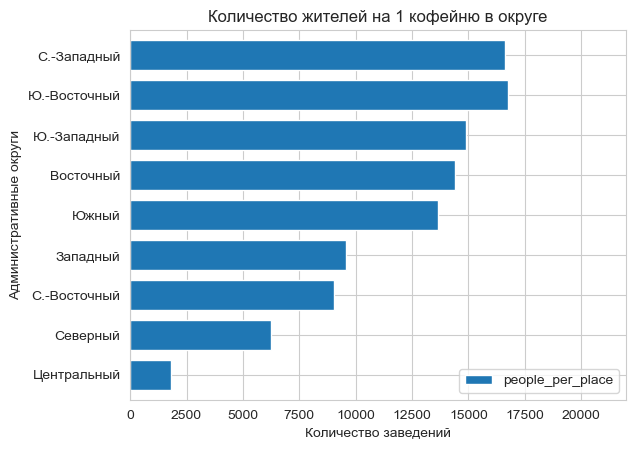

In [128]:
# строим столбчатую диаграмму
places_coffee_house_in_districts[['district', 
                                  'people_per_place']].plot(x='district', kind='barh', width=0.75)
plt.title("Количество жителей на 1 кофейню в округе") # зададим название для диаграммы
plt.xlabel("Количество заведений") # установим название для оси Y
plt.ylabel("Административные округи") # установим название для оси X
plt.xlim([0, 22000]) # зададим минимальное и максимальное значения для оси Y
plt.show() # выведем диаграмму на экран;

В большей части административных округов на 1 кв. км. приходится лишь одна кофейня. В Северном и Северо-Восточном – по 2 кофейни на кв. км., а в В Центральном округе их больше всего – 6 объектов.

При прочих равных условиях, чем меньше кофеен приходится на округ, тем большее количество жителей приходится на 1 кофейню. В 5 округах это значение находится в пределах от 9.5 до 16.5 тыс. жителей, а минимальный показатель принадлежит Центральному округу, где на 1 кофейню приходится 1.8 тыс. жителей. 

Посчитаем количество круглосуточных кофеен среди всех кофеен в датасете, а также изучим их рейтинги.

In [130]:
# считаем количество круглосуточных кофеен
len(places_coffee_house[places_coffee_house['is_24/7'] == True])

59

In [131]:
# считаем долю круглосуточных кофеен
round(len(places_coffee_house[places_coffee_house['is_24/7'] == True]) * 100 / 
      len(places_coffee_house), 
      2)

4.18

In [132]:
# считаем средний рейтинг всех кофеен в городе
round(places_coffee_house['rating'].mean(), 
      2)

4.28

In [133]:
# рассчитаем средние рейтинги кофеен для каждого округа о округлим их до двух знаков после запятой
places_coffee_house.groupby('district').agg({'rating': 'mean'}).sort_values('rating', ascending=False).round(2)

,rating
district,
Центральный административный округ,4.34
Северо-Западный административный округ,4.33
Северный административный округ,4.29
Юго-Западный административный округ,4.28
Восточный административный округ,4.28
Южный административный округ,4.23
Юго-Восточный административный округ,4.23
Северо-Восточный административный округ,4.22
Западный административный округ,4.20


Примерно 4.5% кофеен работают в круглосуточном режиме. Средние рейтинги кофеен в административных округах находятся выше отметки в 4 балла и не сильно отличаются друг от друга.

Посчитаем среднюю стоимость чашки капучино в кофейнях города, а затем в разбивке по округам. Перед этим посчитаем количество пропусков в столбце `middle_coffee_cup` по количеству ранее установленных «заглушек» (555).

In [134]:
# посчитаем количество пропусков в столбце "middle_coffee_cup"
len(places_coffee_house[places_coffee_house.middle_coffee_cup == 555])

892

In [135]:
# посчитаем долю пропусков в столбце "middle_coffee_cup"
round(len(places_coffee_house[places_coffee_house.middle_coffee_cup == 555]) * 100 / 
      len(places_coffee_house),
      2)

63.13

In [136]:
# посчитаем среднюю стоимость чашки капучино
round(places_coffee_house[places_coffee_house.middle_coffee_cup != 555]['middle_coffee_cup'].mean(),
      2)

175.06

In [137]:
# посчитаем среднюю стоимость чашки капучино по округам Москвы и округлим до двух знаков после запятой
(places_coffee_house[places_coffee_house.middle_coffee_cup != 555].groupby('district')
                                                                  .agg({'middle_coffee_cup': 'mean'})
                                                                  .sort_values('middle_coffee_cup', 
                                                                               ascending=False)
                                                                  .round(2))

,middle_coffee_cup
district,
Западный административный округ,189.94
Центральный административный округ,187.52
Юго-Западный административный округ,184.18
Восточный административный округ,174.02
Северный административный округ,165.79
Северо-Западный административный округ,165.52
Северо-Восточный административный округ,165.33
Южный административный округ,158.49
Юго-Восточный административный округ,151.09


При оценке средней стоимости чашки капучино необходимо иметь ввиду, что около 63% кофеен не имеют такой оценки, а потому репрезентовать результаты расчетов не получится. Средняя стоимость чашки капучино – на основании имеющихся данных – находится в интервале 150-190 руб. 

Посмотрим на долю сетевых и несетевых кофеен, а также узнаем, сколько кофеен входит в топ-15 сетевых заведений.

In [138]:
places_coffee_house.groupby('chain').agg({'name': 'count'}).sort_values('name', ascending=False)

,name
chain,
1,721
0,692


In [139]:
# сгруппируем таблицу по наименованию заведения, посчитаем количество каждого из них и оставим только 15 самых крупных
places_coffee_house_in_top_15 = (places_coffee_house.groupby('name')
                                                    .agg({'address': 'count'})
                                                    .sort_values('address', 
                                                                 ascending=False)
                                                    .reset_index().head(15))

# сменим наименование колонки в датасете
places_coffee_house_in_top_15 = places_coffee_house_in_top_15.rename(columns={'address': 'coffee_house_count'})

# объединим две таблицы, чтобы узнать возможные пересечения в названиях кофеен
places_coffee_house_in_top_15 = places_coffee_house_in_top_15.merge(most_popular_points)

# удалим дублирующий столбец из датасета
places_coffee_house_in_top_15.drop('place_counts', axis=1 , inplace=True)

# выведем полученный датасет
places_coffee_house_in_top_15

,name,coffee_house_count
0,шоколадница,119
1,one price coffee,72
2,cofix,65
3,кофепорт,42
4,cofefest,32
5,кофемания,22


<a id="3"></a>

В топ-15 сетевых заведений, которые были определены в [подразделе 2.4](#24), находятся 6 кофеен. 

Посчитаем долю этих кофеен от общего количества кофеен в датасете.

In [140]:
round(places_coffee_house_in_top_15['coffee_house_count'].sum() * 100 / 
      len(places_coffee_house),
      2)

24.91

Посмотрим, как сетевые кофейни, присутствующие в топ-15, расположены на карте.

In [141]:
# оставим в датафрейме с кофейнями только те, которые содержаться в топ-15
places_coffee_house_in_top = places_coffee_house[places_coffee_house['name'].isin(['шоколадница', 
                                         'one price coffee',
                                         'cofix',
                                         'кофепорт',
                                         'cofefest',
                                         'кофемания'])].reset_index(drop=True)

# проверим, чтобы количество кофеен в полученном датафрейме, соответствовало расчетам выше
len(places_coffee_house_in_top)

352

In [142]:
# посмотрим на распределение популярные кофеен по округам
places_coffee_house_in_top.groupby('district').agg({'name': 'count'}).sort_values(by='name', ascending=False)

,name
district,
Центральный административный округ,107
Западный административный округ,44
Северный административный округ,42
Северо-Восточный административный округ,35
Южный административный округ,34
Восточный административный округ,30
Юго-Западный административный округ,25
Северо-Западный административный округ,20
Юго-Восточный административный округ,15


In [145]:
# установим широту (moscow_lat) и долготу (moscow_lng) для центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создадим карту Москвы
m = Map(location=[moscow_lat, moscow_lng], 
        zoom_start=10)

# создадим пустой кластер и добавим его на карту
marker_cluster = MarkerCluster().add_to(m)

# напишем функцию, которая будет принимать строку датафрейма,
# создаст маркер в текущей точке и добавит его в кластер marker_cluster
def create_clusters(row):
    Marker([row['lat'], row['lng']],
           popup=f"{row['name']} {row['rating']}",) \
    .add_to(marker_cluster)

# применим созданную функцию create_clusters() к каждой строке датасета
places_coffee_house_in_top.apply(create_clusters, axis=1)

# выведем карту на экран
m

В целом на юге Москвы число кофеен существенно ниже, чем в северной части города.

Посмотрим на платежеспособность жителей города, а также изучим оборот рынка общественного питания. Согласно [информации](https://77.rosstat.gov.ru/folder/64641) Управления Федеральной службы государственной статистики по г. Москве и Московской области (Мосстат), реальные располагаемые доходы населения (то есть за вычетом обязательных платежей и с учетом инфляции) во II и III кварталах 2022 г. к соответствующему периоду прошлого года просели на 3-4% (информация за IV квартал по состоянию на 30 марта 2023 г. отсутствует).

Несмотря на то, что динамика среднедушевых доходов жителей Москвы в I-III кварталах 2022 г. была [положительной](https://77.rosstat.gov.ru/folder/64641) (от 10 до 20% к соответствующему периоду прошлого года), инфляция оставалась [высокой](https://cbr.ru/hd_base/infl/?UniDbQuery.Posted=True&UniDbQuery.From=01.01.2022&UniDbQuery.To=29.05.2023), достигая в отдельные периоды отметки в 17.8%. Это значит, что потенциальная платежеспособность жителей города не увеличилась.

(Не удалось найти в открытом доступе информацию о распределении доходов жителей города по административным округам Москвы.)

Оборот общественного питания в 2022 г. в сопоставимых ценах к предыдущему остался на [том же уровне](https://rosstat.gov.ru/statistics/roznichnayatorgovlya) – 100,8%, то есть выручка выросла, но физический объем оказанных услуг остался прежним.

В 2022 г. количество объектов общественного питания по сравнению с 2021 г. [увеличилось](https://rosstat.gov.ru/statistics/roznichnayatorgovlya). Так, количество ресторанов, кафе и баров выросло на 16% (на сайте Федеральной службы государственной статистики (Росстат) отсутствует детализация по кофейням, поэтому в рамках этого анализа будем исходить из того, что кафе включают в себя также и кофейни, что, в принципе, не противоречит определению «кафе», данному на [сайте](https://rosstat.gov.ru/statistics/roznichnayatorgovlya) Росстата. При этом площадь зала обслуживания сократилась на 11%, а количество посадочных мест – на 10%. Таким образом, за 2022 г. на рынке общественного питания Москвы стало больше заведений с меньшей площадью и меньшим количеством мест в них.

## Общие выводы и рекомендации по открытию кофейни

**Для возврата к оглавлению нажмите [сюда](#title).**

Около трети всех кофеен находится в Центральном округе Москвы. На севере Москвы кофеен больше, чем в южной части города. В 2/3 московских округов на 1 кв. км. приходится 1 кофейня. В Центральном округе аналогичный показатель выше в 6 раз. Обеспеченность жителей Москвы кофейнями находится в интервале от 1.8 до 16.8 тыс. жителей в расчете на 1 кофейню. Значение этого показателя ниже всего в южной и восточной частях города.

Соотношение сетевых и несетевых кофеен примерно одинаковое. В топ-15 популярных сетей по количеству заведений в Москве кофейням принадлежат 6 позиций, что является максимальным в разбивке по категориям. Эти сетевые кофейни занимают четверь от всех кофеен, представленных в датасете.

Физический объема рынка общественного питания Москвы в 2022 г. сохранился на уровне 2021 г. В 2022 г. стало больше объектов общепита (+16%), но занимаемая ими площадь и количество посадочных мест сократились (-11% и -10% соответственно). С учетом динамики оборота общественного питания за 2022 г., «кусок пирога», приходящийся на один объект общепита, стал меньше. 

Сложная экономическая ситуация для рынка общественного питания, начавшаяся в период пандемии COVID, усложнилась в прошлом году существенным ростом неопределенности. Максимальный, начиная с 2015 г., рост цен, реальное падение доходов населения, снижение уровня общей конкуренции из-за ухода западного бизнеса, огромное количество наложенных санкций, уменьшение числа рабочей силы, вызванное существенной эмиграцией и объявлением мобилизации, ухудшение предпринимательского климата вкупе с нерешенными экономическими проблемами предыдущих лет (зависимость от природных ресурсов, отсутствие и/или слабость институтов, слаборазвития инфраструктура регионов) создают сложные условия для открытия и ведения бизнеса. 

Исходя из проведенного анализа, инвесторам фонда «Shut Up and Take My Money» – по состоянию на март 2023 г. – не рекомендуется открывать кофейню под собственным брендом (полученные для анализа данные относятся к лету 2022 г., а решение об открытии кофейни принимается весной 2023 г., что вносит определенную погрешность в исследование). Экономическая неопределенность и отсутствие ясных перспектив увеличивают расходы на ее открытие, а значит отдаляют момент достижения точки безубыточности и фиксации момента прибыльности.

Вместо открытия собственной кофейни рекомендуется открытие заведения в Юго-Восточном округе Москвы по франшизе одной из сетевых кофеен и использование ее бизнес-модели. В выбранном округе зафиксированы минимальное количество кофеен на 1 кв. км. и самая низкая обеспеченность жителей кофейнями. 

В открытом доступе нам не удалось найти информацию о том, как распределены доходы москвичей по округам. Наличие такой информации помогло бы нам лучше понять платежеспособность москвичей, а также убедиться в правильности выбранного округа. Кроме того, исследование нельзя считать оконченным без изучения финансовых показателей деятельности заведений общепита. Какие-то из них могут пока не приносить прибыль, но иметь востребованный продукт и грамотно налаженный процесс ее реализации, что отразится в перспективе и на прибыльности, и на потенциальной стоимости заведения. А какие-то из них могут быть сегодня прибыльными, но спрос на их продукцию постепенно снижается, а в ее бизнес-модель не вносятся соответствующие изменения.

На основании проведенного исследования инвесторам фонда «Shut Up and Take My Money» можно рекомендовать открытие заведения по франшизе «Шоколадницы», которая представлена двумя заведения в Юго-Восточном округе и имеет самый высокий рейтинг среди всех сетевых кофеен, представленных в округе и предполагающих работу по франшизе (One Price Coffee представлена 6, а Cofix – 4 заведениями). В качестве альтернативы, не уступающей первому решению, рекомендуется использование франшизы кофейни «Кофемания», которая имеет самый высокий рейтинг среди всех заведений Москвы (без разбивки на категории) и пока не представлена в Юго-Восточном округе.